# Feature Selection for Machine learning model
# By- Uddesh Soman
# B Tech Sem 5, Dept. of Electrical Engineering
# UEC Ujjain


Goals

Given a time of day (and maybe some other features, including weather), predict how crowded the gym will be.
Figure out which features are actually important, which are redundant, and what features could be added to make the predictions more accurate.

Data

The dataset consists of 26,000 people counts (about every 10 minutes) over the last year. In addition, I gathered extra info including weather and semester-specific information that might affect how crowded it is. The label is the number of people, which I'd like to predict given some subset of the features.

Label:

Number of people

Features:

date (string; datetime of data)

timestamp (int; number of seconds since beginning of day)

dayofweek (int; 0 [monday] - 6 [sunday])

is_weekend (int; 0 or 1) [boolean, if 1, it's either saturday or sunday, otherwise 0]

is_holiday (int; 0 or 1) [boolean, if 1 it's a federal holiday, 0 otherwise]

temperature (float; degrees fahrenheit)

isstartof_semester (int; 0 or 1) [boolean, if 1 it's the beginning of a school semester, 0 otherwise]

month (int; 1 [jan] - 12 [dec])

hour (int; 0 - 23)

In [1]:
# importing required libraries for data analysis
import numpy as np, pandas as pd, matplotlib.pyplot as plt, seaborn as sns
#inline plots
%matplotlib inline

In [2]:
# supress unnecessary warnings
import warnings
warnings.filterwarnings('ignore')

In [3]:
# loading the dataset
gym = pd.read_csv('gym_data.csv')

In [4]:
# getting a look at the data
gym.head()

,number_people,date,timestamp,day_of_week,is_weekend,is_holiday,temperature,is_start_of_semester,is_during_semester,month,hour
0,37,2015-08-14 17:00:11-07:00,61211,4,0,0,71.76,0,0,8,17
1,45,2015-08-14 17:20:14-07:00,62414,4,0,0,71.76,0,0,8,17
2,40,2015-08-14 17:30:15-07:00,63015,4,0,0,71.76,0,0,8,17
3,44,2015-08-14 17:40:16-07:00,63616,4,0,0,71.76,0,0,8,17
4,45,2015-08-14 17:50:17-07:00,64217,4,0,0,71.76,0,0,8,17


In [5]:
gym.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62184 entries, 0 to 62183
Data columns (total 11 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   number_people         62184 non-null  int64  
 1   date                  62184 non-null  object 
 2   timestamp             62184 non-null  int64  
 3   day_of_week           62184 non-null  int64  
 4   is_weekend            62184 non-null  int64  
 5   is_holiday            62184 non-null  int64  
 6   temperature           62184 non-null  float64
 7   is_start_of_semester  62184 non-null  int64  
 8   is_during_semester    62184 non-null  int64  
 9   month                 62184 non-null  int64  
 10  hour                  62184 non-null  int64  
dtypes: float64(1), int64(9), object(1)
memory usage: 5.2+ MB


In [6]:
# getting statistical overview of the data
gym.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
number_people,62184.0,29.072543,22.689026,0.00,9.0,28.00,43.00,145.00
timestamp,62184.0,45799.437958,24211.275891,0.00,26624.0,46522.50,66612.00,86399.00
day_of_week,62184.0,2.982504,1.996825,0.00,1.0,3.00,5.00,6.00
is_weekend,62184.0,0.282870,0.450398,0.00,0.0,0.00,1.00,1.00
is_holiday,62184.0,0.002573,0.050660,0.00,0.0,0.00,0.00,1.00
temperature,62184.0,58.557108,6.316396,38.14,55.0,58.34,62.28,87.17
is_start_of_semester,62184.0,0.078831,0.269476,0.00,0.0,0.00,0.00,1.00
is_during_semester,62184.0,0.660218,0.473639,0.00,0.0,1.00,1.00,1.00
month,62184.0,7.439824,3.445069,1.00,5.0,8.00,10.00,12.00
hour,62184.0,12.236460,6.717631,0.00,7.0,12.00,18.00,23.00


In [7]:
# getting null values
def nullvalues(data):
    ls = [] 
    for i in data.columns:
        if data[i].isnull().sum() > 0:
            ls.append([i, data[i].isnull().sum()])
    if len(ls) != 0:
        print('Null values are present in ', ls)
        for i in ls:  # getting Percentage Null values and their datatype
            nullpercent = i[1]/data.shape[0]
            nullpercent = round(nullpercent,6)
            dt = type(data[i[0]][1])
            print(f'Null percentage in {i[0]} is {nullpercent * 100} % and datatype {dt}')
            return ls
    else: print('No Null values')

In [8]:
nullvalues(gym)

No Null values


The data is clean with no nulls or improper fillers. Here I will extract date of month and minutes of hour from the date feature as these seem relevant features. I would have also considered humidity and season but those features are not available in the data, neither can be constructed using available variables.  Seasons could be derived using months but I'm not sure about the location of gym so can't assign it ambigiously.

In [9]:
type(gym.date[0])

str

In [10]:
# the object is of type str so we 
# extracting date and minutes using pandas.to_datetime
#we can use string split with lambda and apply but using pandas datetime object is easier
gym['date'] = pd.to_datetime(gym['date'])

In [11]:
gym['minute'] = gym['date'].apply(lambda x: x.minute)
gym['day'] = gym['date'].apply(lambda x: x.day)
gym.head().transpose()

,0,1,2,3,4
number_people,37,45,40,44,45
date,2015-08-14 17:00:11-07:00,2015-08-14 17:20:14-07:00,2015-08-14 17:30:15-07:00,2015-08-14 17:40:16-07:00,2015-08-14 17:50:17-07:00
timestamp,61211,62414,63015,63616,64217
day_of_week,4,4,4,4,4
is_weekend,0,0,0,0,0
is_holiday,0,0,0,0,0
temperature,71.76,71.76,71.76,71.76,71.76
is_start_of_semester,0,0,0,0,0
is_during_semester,0,0,0,0,0
month,8,8,8,8,8


In [12]:
# we can drop date column as it is no longer required
gym.drop('date', axis = 1, inplace = True)
gym.head()

,number_people,timestamp,day_of_week,is_weekend,is_holiday,temperature,is_start_of_semester,is_during_semester,month,hour,minute,day
0,37,61211,4,0,0,71.76,0,0,8,17,0,14
1,45,62414,4,0,0,71.76,0,0,8,17,20,14
2,40,63015,4,0,0,71.76,0,0,8,17,30,14
3,44,63616,4,0,0,71.76,0,0,8,17,40,14
4,45,64217,4,0,0,71.76,0,0,8,17,50,14


In [13]:
#checking null again
nullvalues(gym)

No Null values


In [14]:
# checking uniques
for i in gym.columns:
    print(i, gym[i].nunique())

number_people 128
timestamp 31321
day_of_week 7
is_weekend 2
is_holiday 2
temperature 2599
is_start_of_semester 2
is_during_semester 2
month 12
hour 24
minute 60
day 31


In [15]:
# checking info for datatypes
gym.info() # all should be numerical, int or float

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 62184 entries, 0 to 62183
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   number_people         62184 non-null  int64  
 1   timestamp             62184 non-null  int64  
 2   day_of_week           62184 non-null  int64  
 3   is_weekend            62184 non-null  int64  
 4   is_holiday            62184 non-null  int64  
 5   temperature           62184 non-null  float64
 6   is_start_of_semester  62184 non-null  int64  
 7   is_during_semester    62184 non-null  int64  
 8   month                 62184 non-null  int64  
 9   hour                  62184 non-null  int64  
 10  minute                62184 non-null  int64  
 11  day                   62184 non-null  int64  
dtypes: float64(1), int64(11)
memory usage: 5.7 MB


# exploratory data analysis using seaborn and matplotlib

In [16]:
gym.head()

,number_people,timestamp,day_of_week,is_weekend,is_holiday,temperature,is_start_of_semester,is_during_semester,month,hour,minute,day
0,37,61211,4,0,0,71.76,0,0,8,17,0,14
1,45,62414,4,0,0,71.76,0,0,8,17,20,14
2,40,63015,4,0,0,71.76,0,0,8,17,30,14
3,44,63616,4,0,0,71.76,0,0,8,17,40,14
4,45,64217,4,0,0,71.76,0,0,8,17,50,14


<AxesSubplot:>

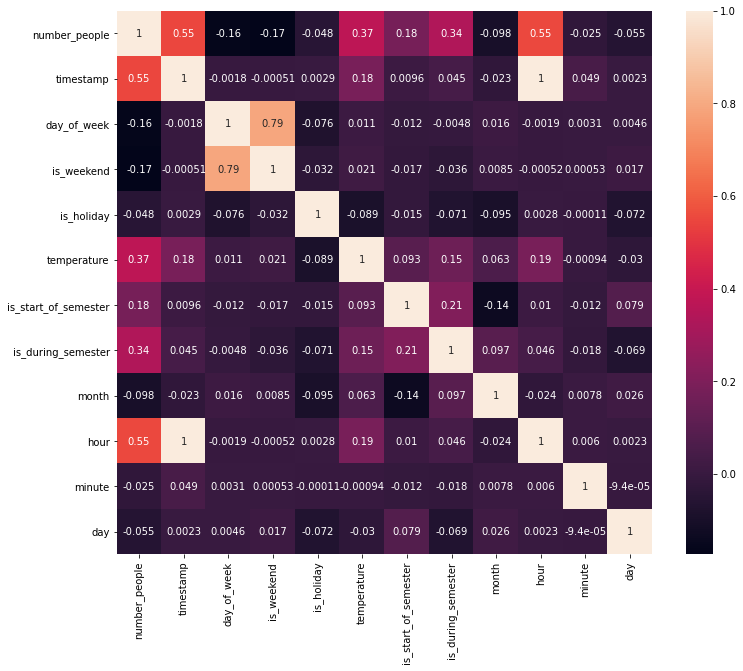

In [17]:
#getting correlation matrix
mat = gym.corr()
fig = plt.figure(figsize =(12,10))
sns.heatmap(mat, annot = True)

Most of the features are independent of each other, except for timestamp and hour which are perfectly linear to each othe hence have correlation 1. We will drop them based on information gain they provide to our model. Weekend has strong correlation with day of weak. we will keep both in baseline model and proceed according to PCA.

On the downside neither of the feature show any strong coorelation with our target variable so prediction may become hard. We will see the normality of the data and see if Box Cox transformation could help us getting better relations with target data.

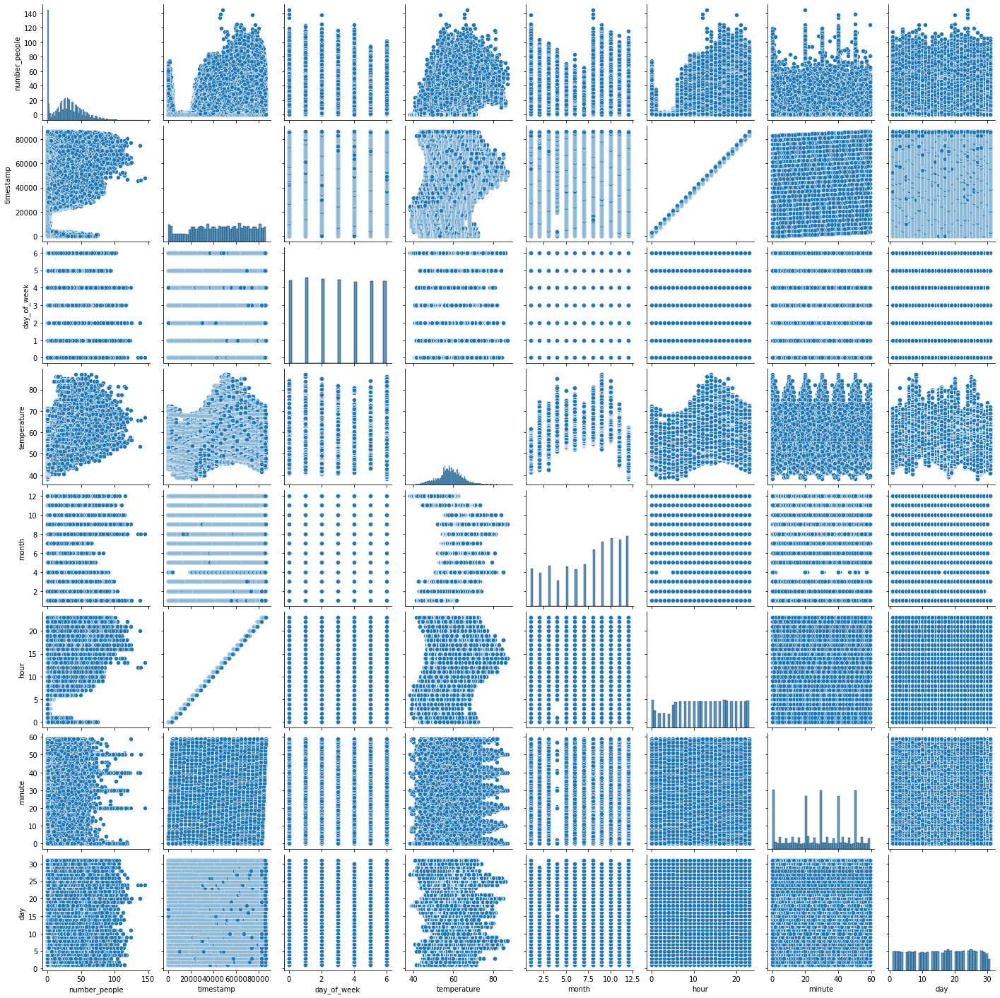

In [18]:
# Getting pairplots among numerical columns to see their relationships
cols = ['number_people', 'timestamp', 'day_of_week', 'temperature', 'month', 'hour', 'minute', 'day']
sns.pairplot(gym[cols])

<AxesSubplot:title={'center':'Histplot for number of people'}, xlabel='number_people', ylabel='Count'>

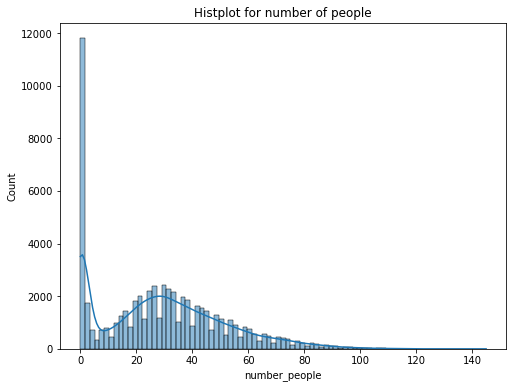

In [19]:
fig = plt.figure(figsize = (8,6))
plt.title('Histplot for number of people')
sns.histplot(gym.number_people, kde = True)

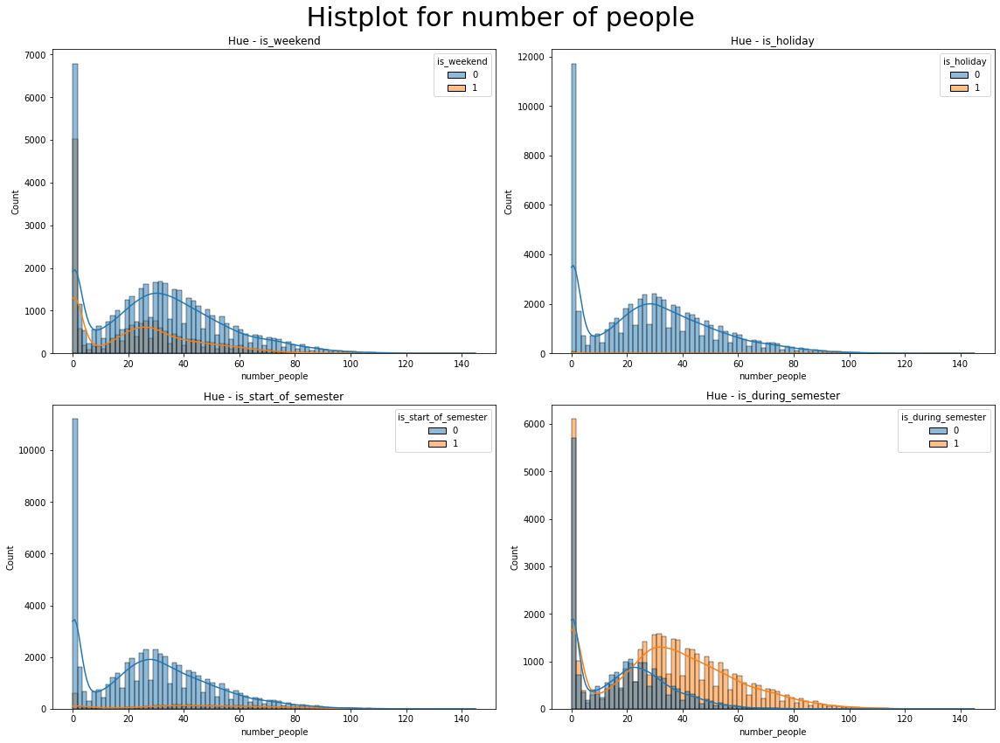

In [20]:
fig, ax = plt.subplots(2,2, figsize = (16,12))
fig.suptitle(' Histplot for number of people ', fontsize=30)
ax[0][0].set_title('Hue - is_weekend')
sns.histplot(x = 'number_people',data = gym, hue = 'is_weekend', kde = True, ax = ax[0][0])
ax[0][1].set_title('Hue - is_holiday')
sns.histplot(x = 'number_people',data = gym, hue = 'is_holiday', kde = True, ax = ax[0][1])
ax[1][0].set_title('Hue - is_start_of_semester')
sns.histplot(x = 'number_people',data = gym, hue = 'is_start_of_semester', kde = True, ax = ax[1][0])
ax[1][1].set_title('Hue - is_during_semester')
sns.histplot(x = 'number_people',data = gym, hue = 'is_during_semester', kde = True, ax = ax[1][1])
plt.tight_layout()

Number of people data is not normally distributed. The lower end is extremly peaked and some skewness to the right. The croud appears more on weekdays, non holidays. More counts for any number of people is some time after the beginning of semester. Croud is more likely during semesters and not breaks.

<AxesSubplot:title={'center':'Histplot for Timestamp'}, xlabel='timestamp', ylabel='Count'>

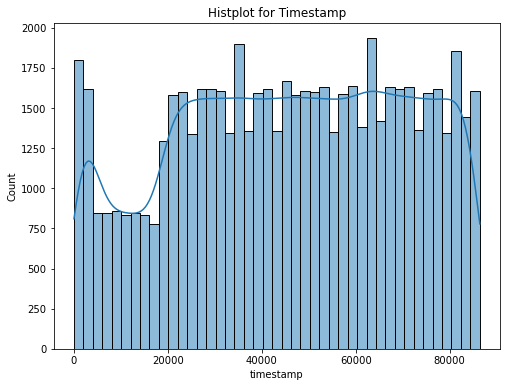

In [21]:
fig = plt.figure(figsize = (8,6))
plt.title('Histplot for Timestamp')
sns.histplot(gym.timestamp, kde = True)

The count of various timestamps is not normally distributed

<AxesSubplot:title={'center':'Histplot for Temperature'}, xlabel='temperature', ylabel='Count'>

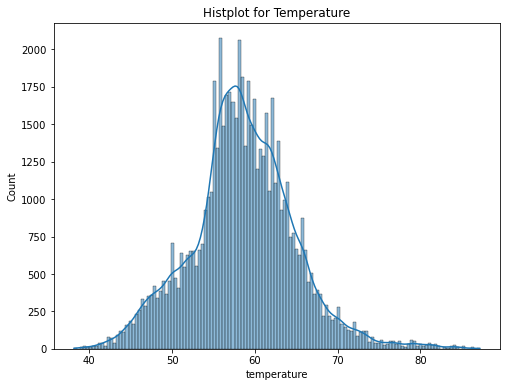

In [22]:
fig = plt.figure(figsize = (8,6))
plt.title('Histplot for Temperature')
sns.histplot(gym.temperature, kde = True)

Temperature has somewhat normal distribution which is good.


<AxesSubplot:title={'center':'Histplot for day'}, xlabel='day', ylabel='Count'>

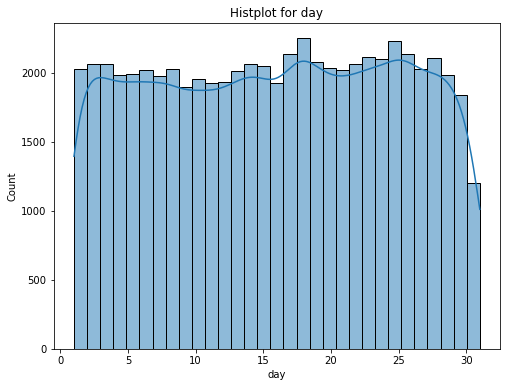

In [23]:
fig = plt.figure(figsize = (8,6))
plt.title('Histplot for day')
sns.histplot(gym.day, kde = True, bins = 31)

The data is not normally distributed

<AxesSubplot:title={'center':'Histplot for day_of_week'}, xlabel='day_of_week', ylabel='Count'>

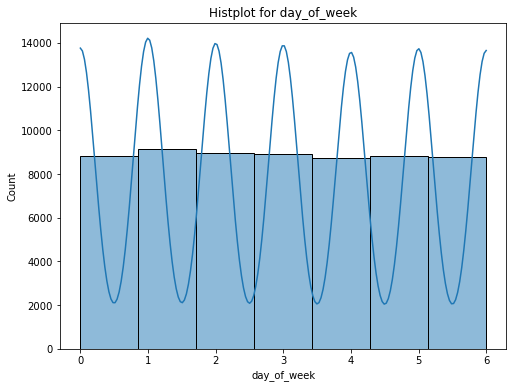

In [24]:
fig = plt.figure(figsize = (8,6))
plt.title('Histplot for day_of_week')
sns.histplot(gym.day_of_week, kde = True, bins = 7)

The data is not normally distributed

<AxesSubplot:title={'center':'Histplot for month'}, xlabel='month', ylabel='Count'>

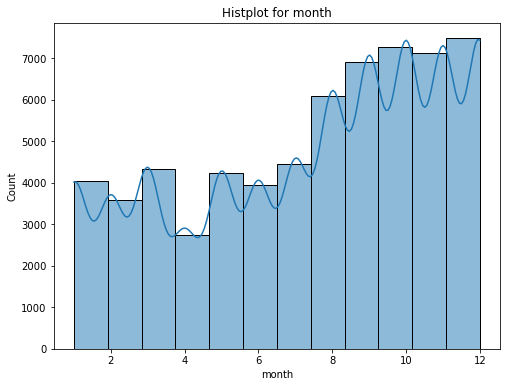

In [25]:
fig = plt.figure(figsize = (8,6))
plt.title('Histplot for month')
sns.histplot(gym.month, kde = True, bins = 12)

The data is not normally distributed

<AxesSubplot:title={'center':'Histplot for hour'}, xlabel='hour', ylabel='Count'>

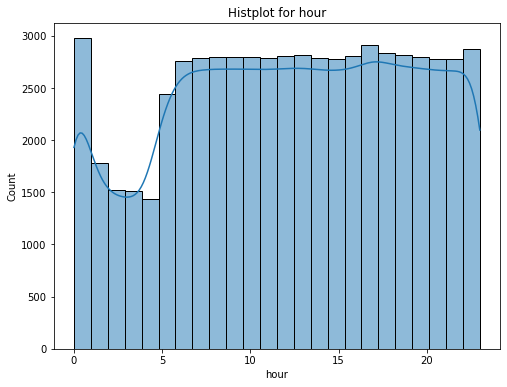

In [26]:
fig = plt.figure(figsize = (8,6))
plt.title('Histplot for hour')
sns.histplot(gym.hour, kde = True,bins = 24 )

The data is not normally distributed

<AxesSubplot:title={'center':'Histplot for minute'}, xlabel='minute', ylabel='Count'>

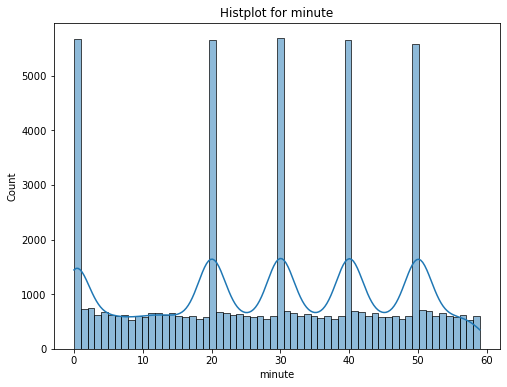

In [27]:
fig = plt.figure(figsize = (8,6))
plt.title('Histplot for minute')
sns.histplot(gym.minute, kde = True, bins = 60 )

The data is not normally distributed

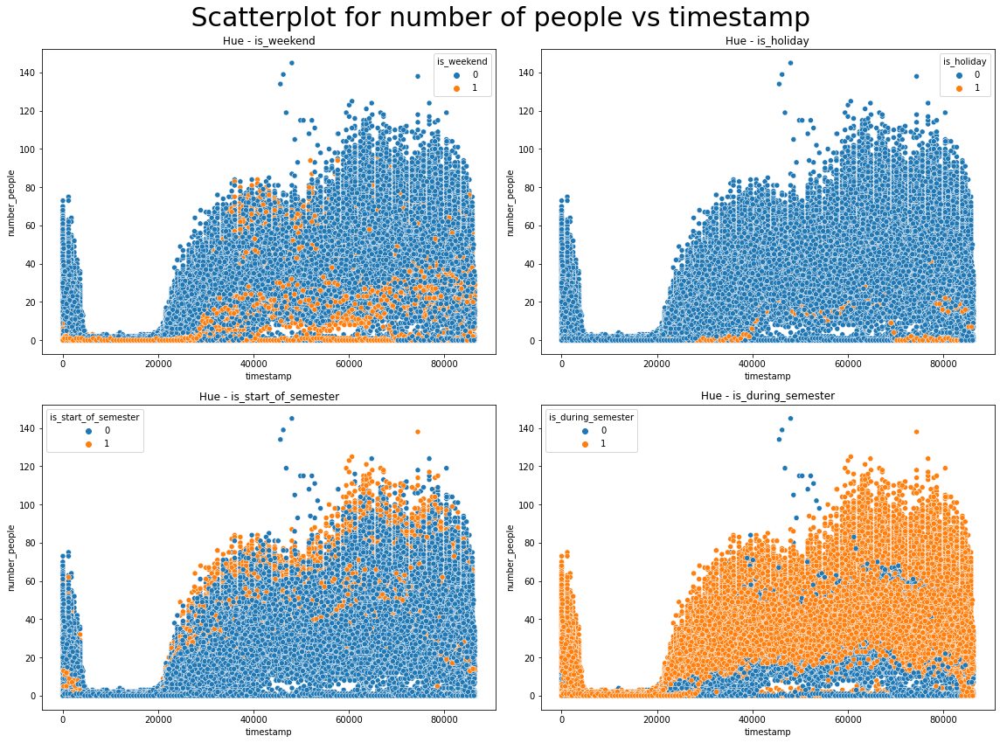

In [28]:
fig, ax = plt.subplots(2,2, figsize = (16,12))
fig.suptitle(' Scatterplot for number of people vs timestamp ', fontsize=30)
ax[0][0].set_title('Hue - is_weekend')
sns.scatterplot(x='timestamp' ,y = 'number_people',data = gym, hue = 'is_weekend', ax = ax[0][0])
ax[0][1].set_title('Hue - is_holiday')
sns.scatterplot(x = 'timestamp',y = 'number_people',data = gym, hue = 'is_holiday',  ax = ax[0][1])
ax[1][0].set_title('Hue - is_start_of_semester')
sns.scatterplot(x = 'timestamp',y = 'number_people',data = gym, hue = 'is_start_of_semester',  ax = ax[1][0])
ax[1][1].set_title('Hue - is_during_semester')
sns.scatterplot(x = 'timestamp',y = 'number_people',data = gym, hue = 'is_during_semester', ax = ax[1][1])
plt.tight_layout()

The data is not linear in nature with respect to the target variable.

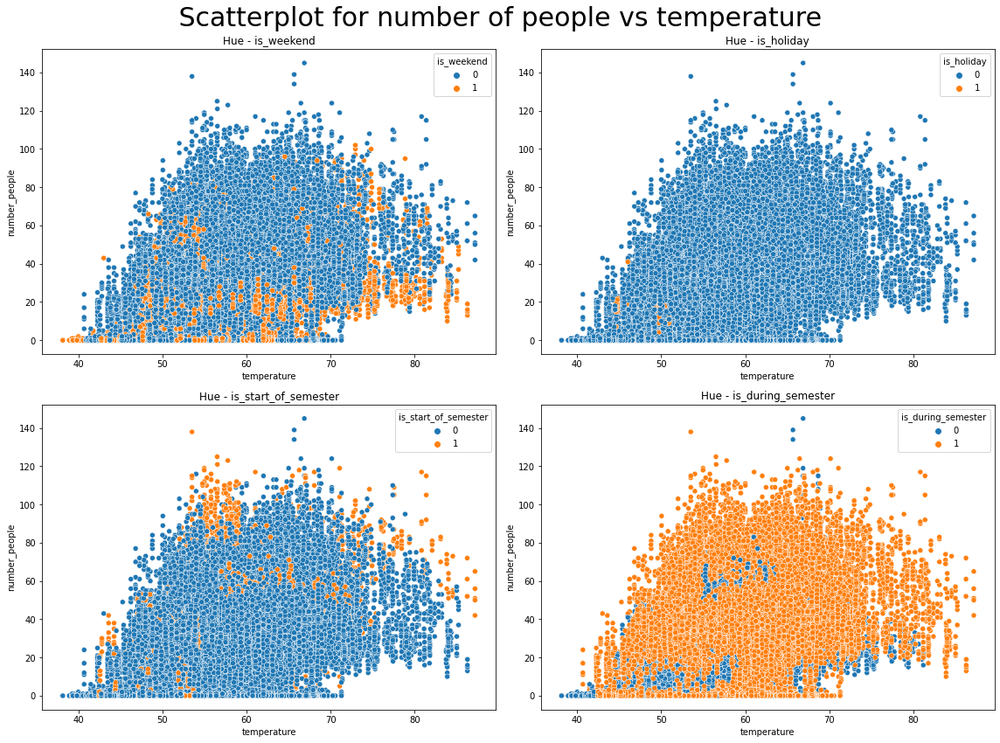

In [29]:
fig, ax = plt.subplots(2,2, figsize = (16,12))
fig.suptitle(' Scatterplot for number of people vs temperature ', fontsize=30)
ax[0][0].set_title('Hue - is_weekend')
sns.scatterplot(x='temperature' ,y = 'number_people',data = gym, hue = 'is_weekend', ax = ax[0][0])
ax[0][1].set_title('Hue - is_holiday')
sns.scatterplot(x = 'temperature',y = 'number_people',data = gym, hue = 'is_holiday',  ax = ax[0][1])
ax[1][0].set_title('Hue - is_start_of_semester')
sns.scatterplot(x = 'temperature',y = 'number_people',data = gym, hue = 'is_start_of_semester',  ax = ax[1][0])
ax[1][1].set_title('Hue - is_during_semester')
sns.scatterplot(x = 'temperature',y = 'number_people',data = gym, hue = 'is_during_semester', ax = ax[1][1])
plt.tight_layout()

The data isnt linear and peaks in 50 'F to 70 'f range

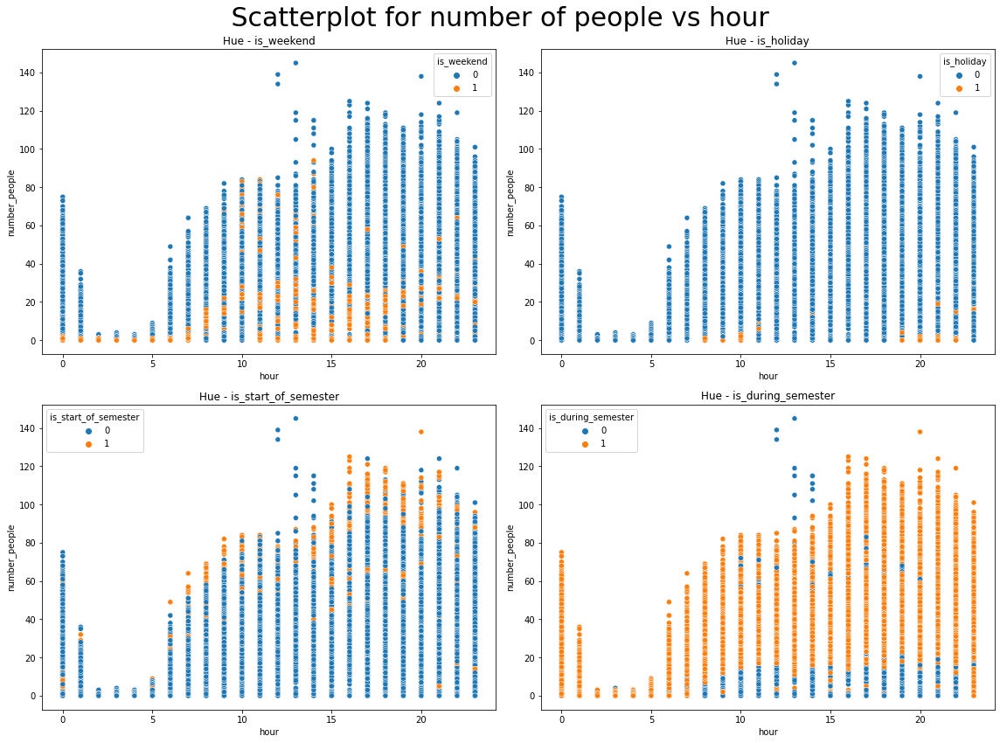

In [30]:
fig, ax = plt.subplots(2,2, figsize = (16,12))
fig.suptitle(' Scatterplot for number of people vs hour ', fontsize=30)
ax[0][0].set_title('Hue - is_weekend')
sns.scatterplot(x='hour' ,y = 'number_people',data = gym, hue = 'is_weekend', ax = ax[0][0])
ax[0][1].set_title('Hue - is_holiday')
sns.scatterplot(x = 'hour',y = 'number_people',data = gym, hue = 'is_holiday',  ax = ax[0][1])
ax[1][0].set_title('Hue - is_start_of_semester')
sns.scatterplot(x = 'hour',y = 'number_people',data = gym, hue = 'is_start_of_semester',  ax = ax[1][0])
ax[1][1].set_title('Hue - is_during_semester')
sns.scatterplot(x = 'hour',y = 'number_people',data = gym, hue = 'is_during_semester', ax = ax[1][1])
plt.tight_layout()

The data is not linear in nature with respect to the target variable.

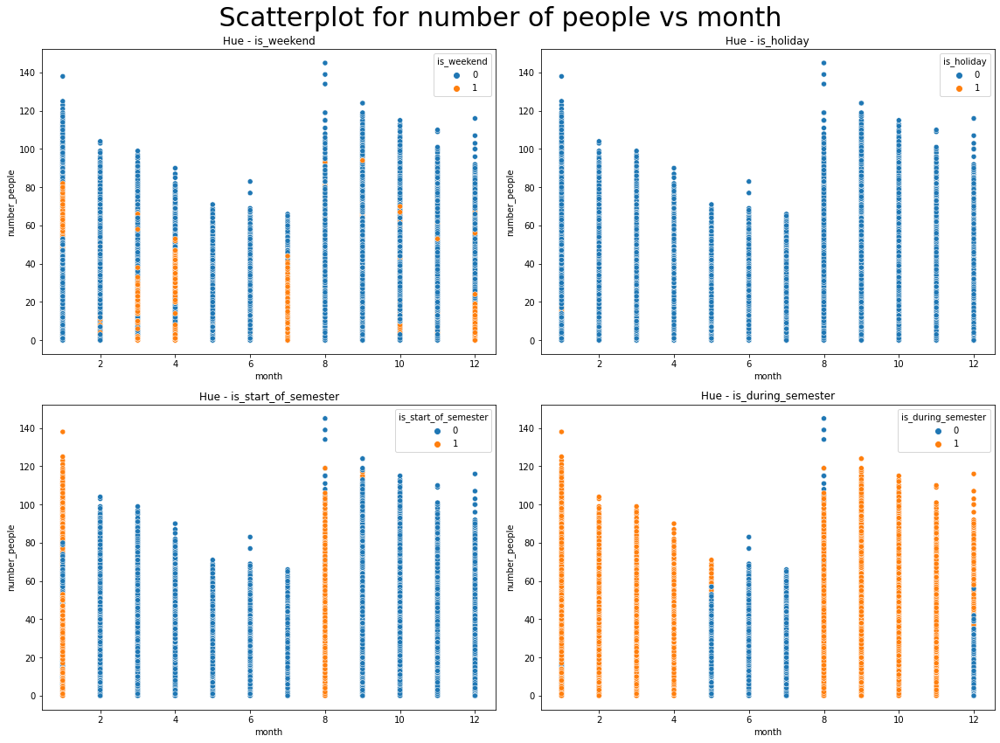

In [31]:
fig, ax = plt.subplots(2,2, figsize = (16,12))
fig.suptitle(' Scatterplot for number of people vs month ', fontsize=30)
ax[0][0].set_title('Hue - is_weekend')
sns.scatterplot(x='month' ,y = 'number_people',data = gym, hue = 'is_weekend', ax = ax[0][0])
ax[0][1].set_title('Hue - is_holiday')
sns.scatterplot(x = 'month',y = 'number_people',data = gym, hue = 'is_holiday',  ax = ax[0][1])
ax[1][0].set_title('Hue - is_start_of_semester')
sns.scatterplot(x = 'month',y = 'number_people',data = gym, hue = 'is_start_of_semester',  ax = ax[1][0])
ax[1][1].set_title('Hue - is_during_semester')
sns.scatterplot(x = 'month',y = 'number_people',data = gym, hue = 'is_during_semester', ax = ax[1][1])
plt.tight_layout()

The data is not linear in nature with respect to the target variable.

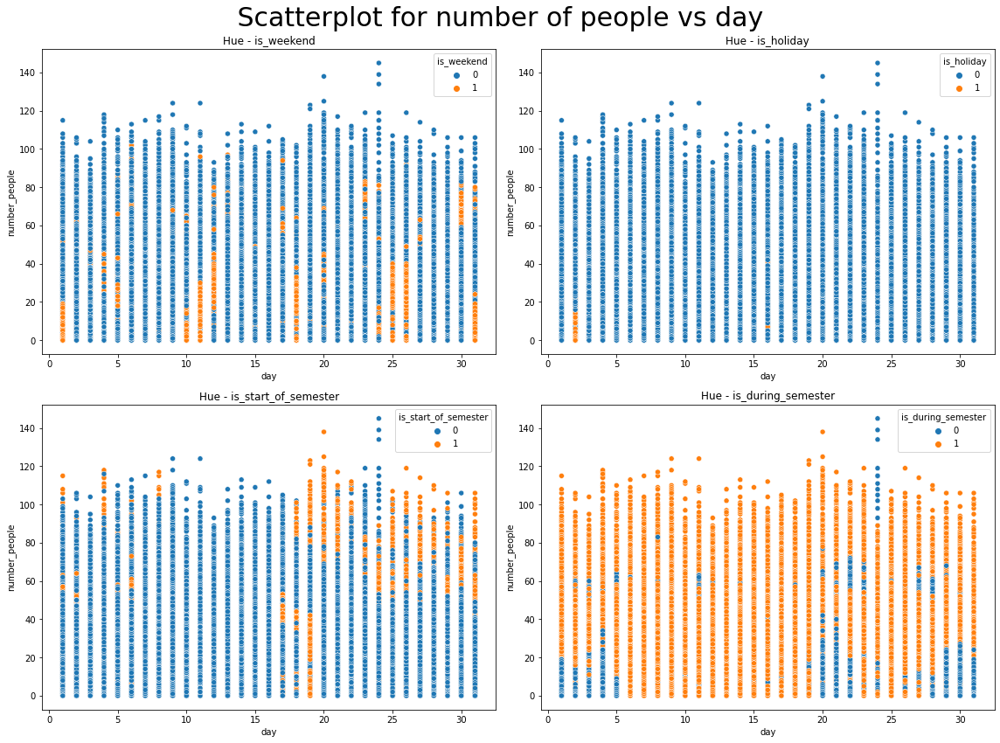

In [32]:
fig, ax = plt.subplots(2,2, figsize = (16,12))
fig.suptitle(' Scatterplot for number of people vs day ', fontsize=30)
ax[0][0].set_title('Hue - is_weekend')
sns.scatterplot(x='day' ,y = 'number_people',data = gym, hue = 'is_weekend', ax = ax[0][0])
ax[0][1].set_title('Hue - is_holiday')
sns.scatterplot(x = 'day',y = 'number_people',data = gym, hue = 'is_holiday',  ax = ax[0][1])
ax[1][0].set_title('Hue - is_start_of_semester')
sns.scatterplot(x = 'day',y = 'number_people',data = gym, hue = 'is_start_of_semester',  ax = ax[1][0])
ax[1][1].set_title('Hue - is_during_semester')
sns.scatterplot(x = 'day',y = 'number_people',data = gym, hue = 'is_during_semester', ax = ax[1][1])
plt.tight_layout()

The data is not linear in nature with respect to the target variable.

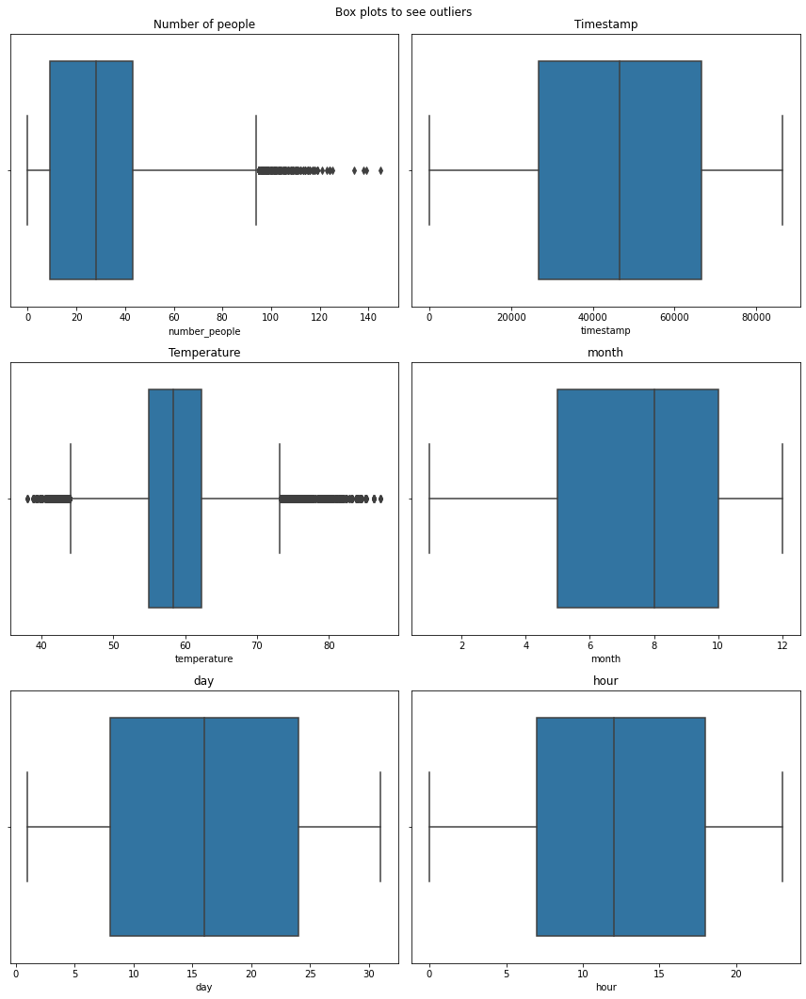

In [33]:
#Checking for outliers using boxplot
fig, ax = plt.subplots(3,2, figsize = (12, 15))
fig.suptitle('Box plots to see outliers')
ax[0][0].set_title('Number of people')
sns.boxplot(gym.number_people, ax = ax[0][0])
ax[0][1].set_title('Timestamp')
sns.boxplot(gym.timestamp, ax = ax[0][1])
ax[1][0].set_title('Temperature')
sns.boxplot(gym.temperature, ax = ax[1][0])
ax[1][1].set_title('month')
sns.boxplot(gym.month, ax = ax[1][1])
ax[2][0].set_title('day')
sns.boxplot(gym.day, ax = ax[2][0])
ax[2][1].set_title('hour')
sns.boxplot(gym.hour, ax = ax[2][1])
plt.tight_layout()

There are outliers in Timestamp and number of people but w wont drop them as huge part of data will be lost

Treating data to be modelled.

In [34]:
# splitting data and scaling data
from sklearn.model_selection import train_test_split
df_train, df_test = train_test_split(gym, train_size = 0.7, test_size = 0.3, random_state = 42)
dtrain = df_train.copy()
dtest = df_test.copy()
from sklearn.preprocessing import RobustScaler


In [35]:
dtest.shape , dtrain.shape


((18656, 12), (43528, 12))

In [36]:
xtrain = dtrain[[x for x in dtrain.columns if x not in ['number_people']]]
ytrain = dtrain['number_people']

xtest = dtest[[x for x in dtest.columns if x not in ['number_people']]]
ytest = dtest['number_people']

# creating model

In [37]:
from sklearn.linear_model import LinearRegression
model = LinearRegression()
model = model.fit(xtrain, ytrain)

In [38]:
from sklearn.metrics import mean_squared_error
from math import sqrt
from sklearn.metrics import r2_score
def analyse(model, x, y, label):
    y_pred = model.predict(x)
    residuals =  y_pred - y
    
    rmse = sqrt(mean_squared_error(y, y_pred))
    print('Model RMSE:',round(rmse, 4))

    r2=r2_score(y, y_pred)
    print('Model r2_score:',round(r2, 4))


    fig , ax = plt.subplots(1,3, figsize = (15,5))
    plt.suptitle(f'Model analysis for {label} data', fontsize=30)
    ax[0].set_title('Error Distribution')
    ax[0].set_xlabel('Error Values')
    p1 = sns.histplot(residuals, kde = True, bins = 50, ax = ax[0])
    
    ax[1].set_title('actual vs predictions')
    ax[1].set_ylabel('predictons')
    ax[1].set_xlabel('actual')
    p2 = sns.scatterplot(y, y_pred, ax = ax[1])
    ax[2].set_title('Residual plot')
    
    p3 = sns.residplot(y, residuals, lowess = True, ax = ax[2])
    ax[2].set_ylabel('residuals')
    ax[2].set_xlabel('number of people')
    plt.tight_layout()

Model RMSE: 15.5941
Model r2_score: 0.5273


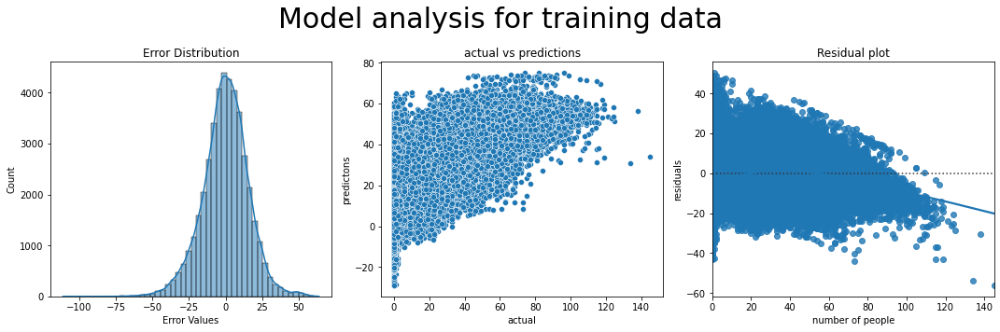

In [39]:
analyse(model, xtrain, ytrain, 'training')

Model RMSE: 13.3937
Model r2_score: 0.6513


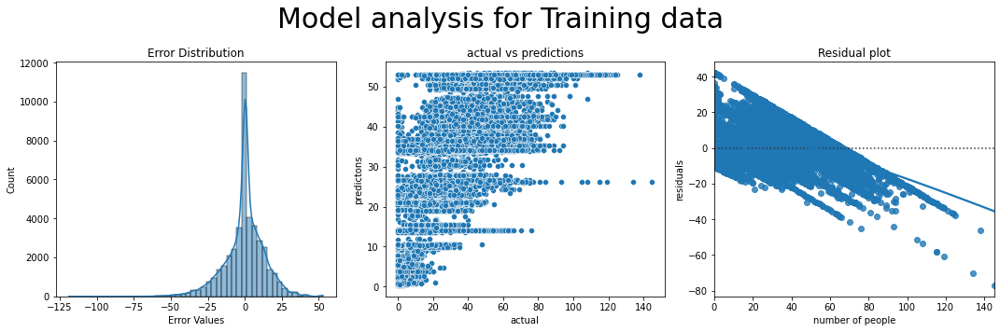

In [40]:
from sklearn.ensemble import RandomForestRegressor
rforest = RandomForestRegressor(max_depth = 5)
rforest.fit(xtrain, ytrain)
analyse(rforest, xtrain, ytrain, 'Training')

Model RMSE: 13.4265
Model r2_score: 0.6503


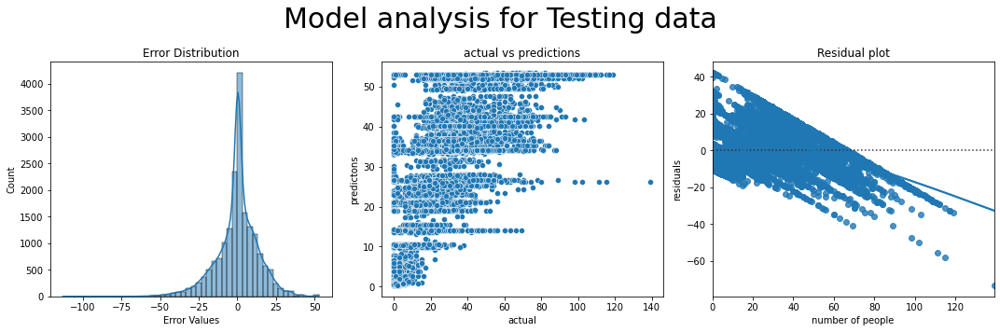

In [41]:
analyse(rforest, xtest, ytest, 'Testing')

Model RMSE: 6.6895
Model r2_score: 0.913


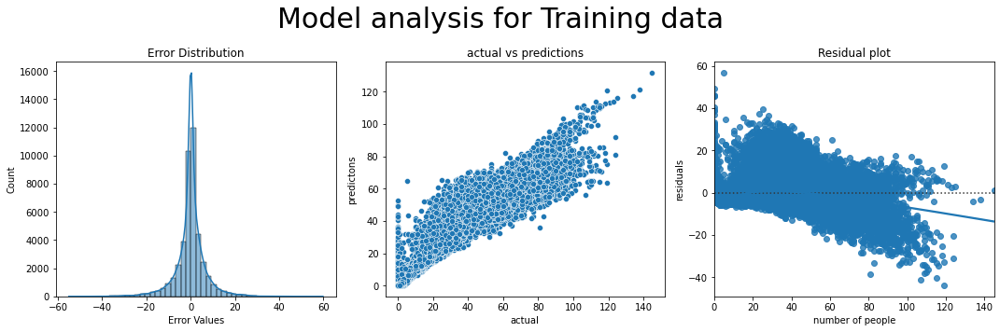

In [42]:
rforest = RandomForestRegressor( max_depth = 15)
rforest.fit(xtrain, ytrain)
analyse(rforest, xtrain, ytrain, 'Training')

Model RMSE: 7.9871
Model r2_score: 0.8762


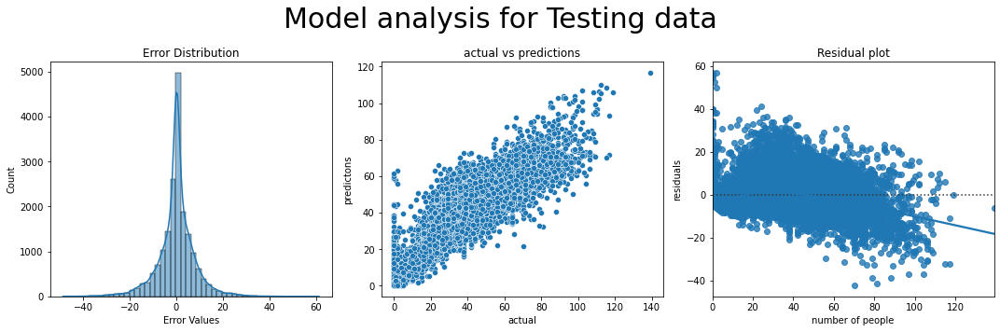

In [43]:
analyse(rforest, xtest, ytest, 'Testing')

random forest regressor is quite efficient for higher vale of depths, the predictions and actual values are much closer as compared to linear regression. homoscadasticity is still low for this regressor.

# Using Box cox transform to normalize the data

In [44]:
from scipy import stats

In [45]:
# columns to be normalized
cols = ['number_people','hour','minute','day_of_week','day','month','temperature', 'timestamp']
for i in cols:
    dtrain[i] = dtrain[i].apply(lambda x: x + 1)
    dtest[i] = dtest[i].apply(lambda x: x + 1)
    dtrain[i], fit_lambda = stats.boxcox(dtrain[i])
    dtest[i] = stats.boxcox(dtest[i], fit_lambda)

<AxesSubplot:xlabel='number_people', ylabel='Count'>

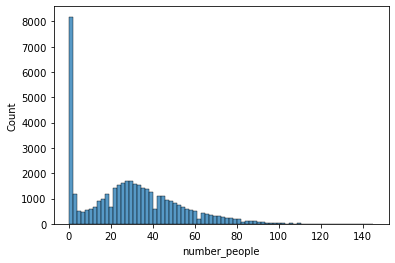

In [46]:
sns.histplot(df_train.number_people)

<AxesSubplot:xlabel='temperature', ylabel='Count'>

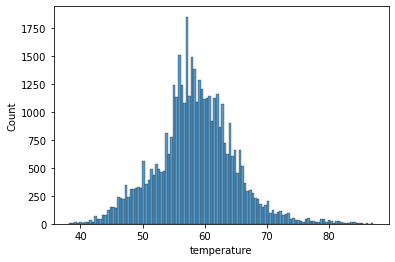

In [47]:
sns.histplot(df_train.temperature)

<AxesSubplot:xlabel='hour', ylabel='Count'>

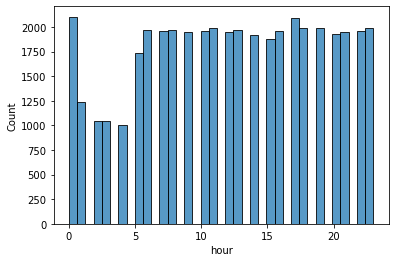

In [48]:
sns.histplot(df_train.hour)

<AxesSubplot:>

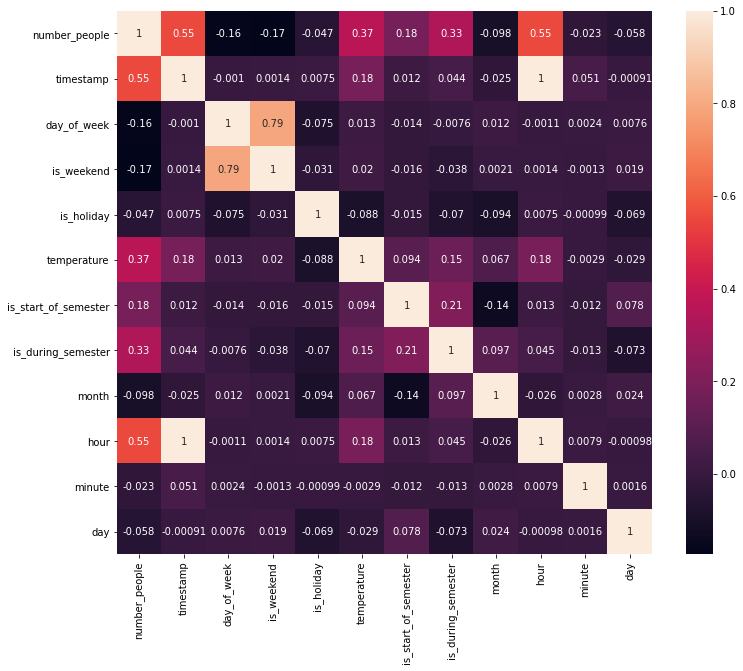

In [49]:
fig = plt.figure(figsize = (12,10) )
sns.heatmap(df_train.corr(), annot = True)

In [50]:
xtrain = dtrain[[x for x in dtrain.columns if x not in ['number_people']]]
ytrain = dtrain['number_people']

xtest = dtest[[x for x in dtest.columns if x not in ['number_people']]]
ytest = dtest['number_people']

In [51]:
model = model.fit(xtrain, ytrain)

Model RMSE: 3.2562
Model r2_score: 0.5504


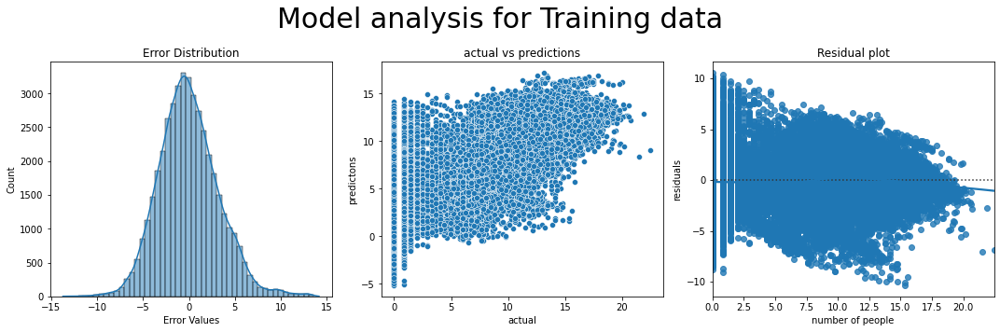

In [52]:
analyse(model, xtrain, ytrain, 'Training')

Model RMSE: 3.2504
Model r2_score: 0.5575


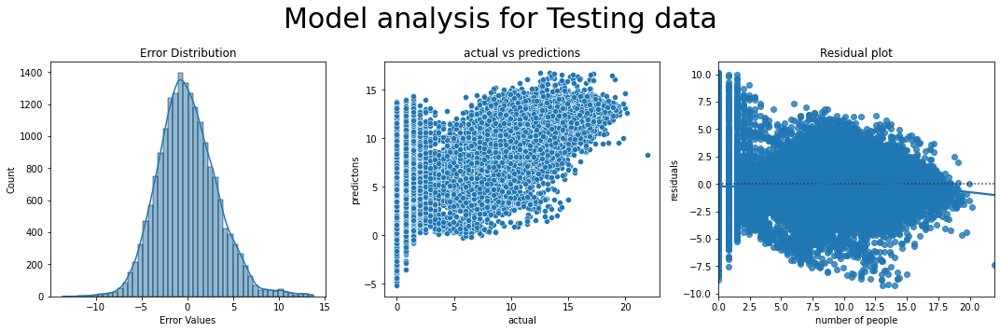

In [53]:
analyse(model, xtest, ytest, 'Testing')

Model RMSE: 1.1046
Model r2_score: 0.9483


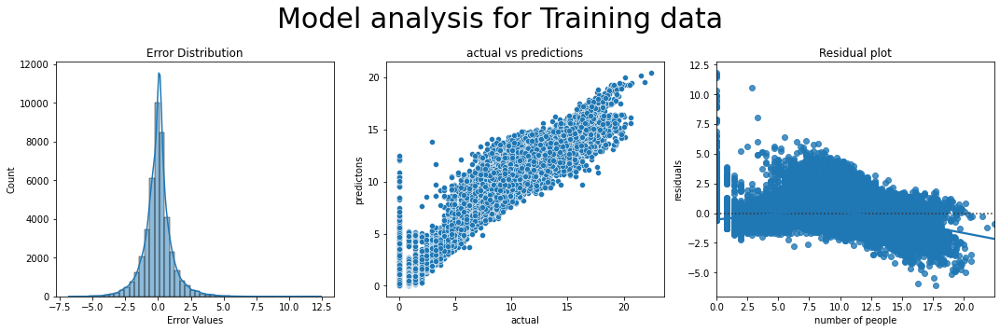

In [54]:
rforest = RandomForestRegressor( max_depth = 15)
rforest.fit(xtrain, ytrain)
analyse(rforest, xtrain, ytrain, 'Training')

Model RMSE: 1.3593
Model r2_score: 0.9226


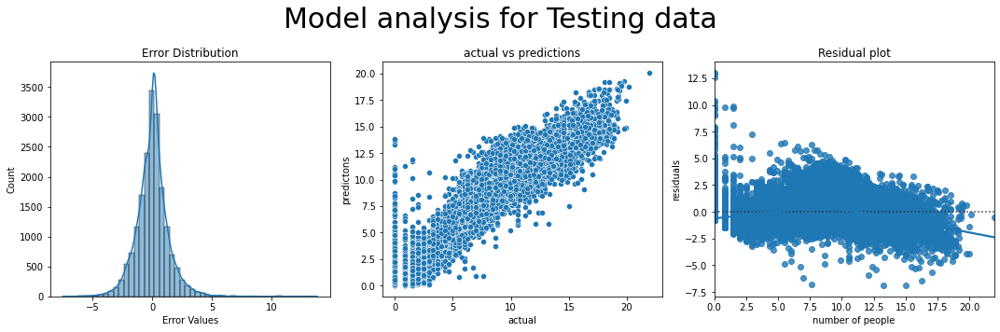

In [55]:
analyse(rforest, xtest, ytest, 'Testing')

# feature selection on basis of coefficient of correlation

<AxesSubplot:>

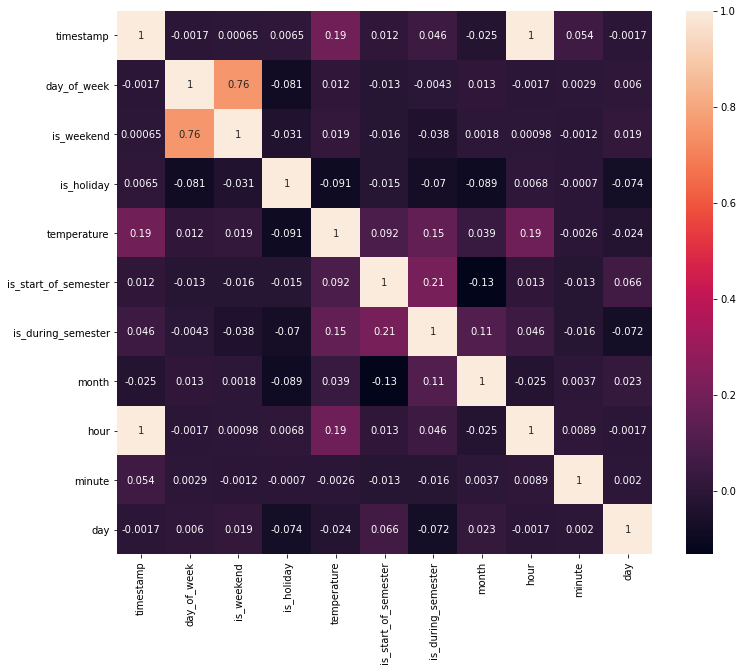

In [56]:
fig = plt.figure(figsize= (12,10))
sns.heatmap(xtrain.corr(), annot = True)

In [57]:
# any correlation more than 0.7 should be removed
# removing timestamp and day of week
xtrain = df_train[[x for x in df_train.columns if x not in ['number_people', 'timestamp', 'day_of_week']]]
xtest = df_test[[x for x in df_test.columns if x not in ['number_people', 'timestamp', 'day_of_week']]]

In [58]:
xtrain.shape, xtest.shape

((43528, 9), (18656, 9))

Model RMSE: 3.2969
Model r2_score: 0.539


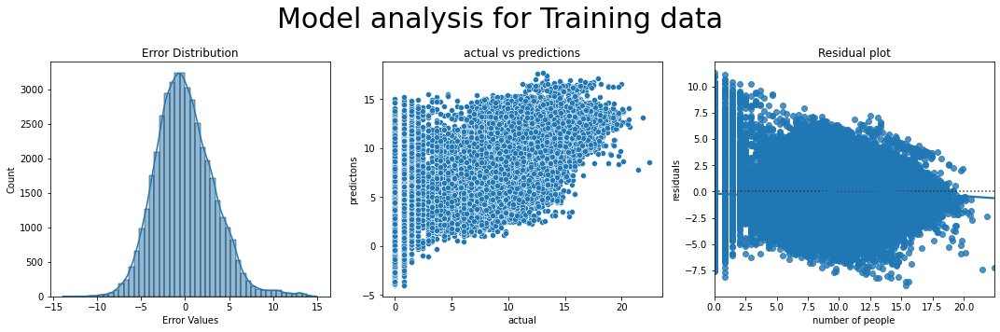

In [59]:
model.fit(xtrain, ytrain)
analyse(model, xtrain, ytrain, 'Training')

Model RMSE: 3.3018
Model r2_score: 0.5434


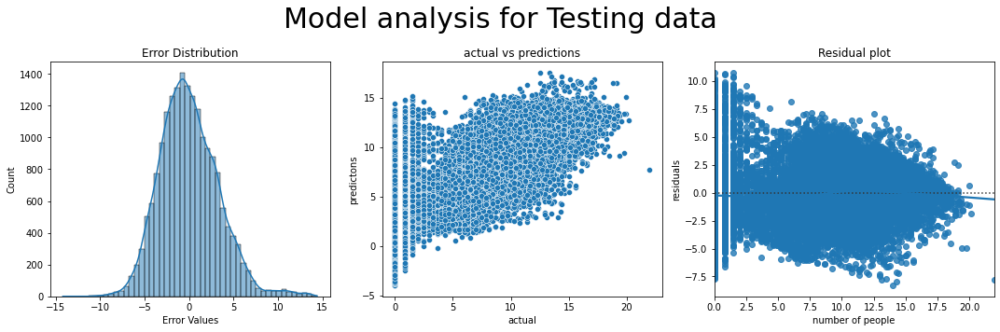

In [60]:
analyse(model, xtest, ytest, 'Testing')

Model RMSE: 1.1682
Model r2_score: 0.9421


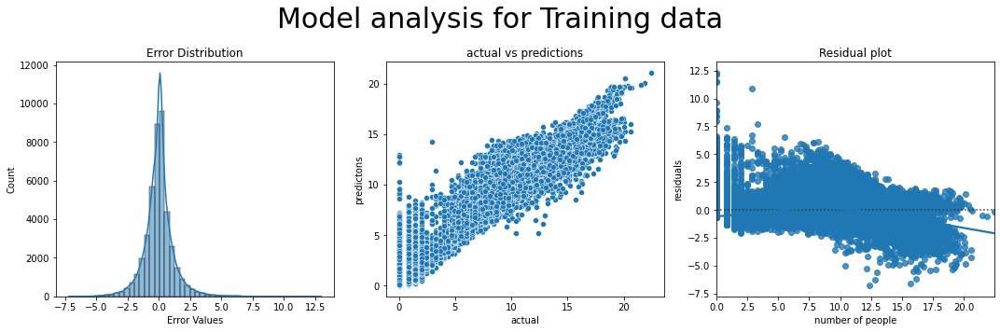

In [61]:
rforest = RandomForestRegressor( max_depth = 15)
rforest.fit(xtrain, ytrain)
analyse(rforest, xtrain, ytrain, 'Training')

Model RMSE: 1.4923
Model r2_score: 0.9067


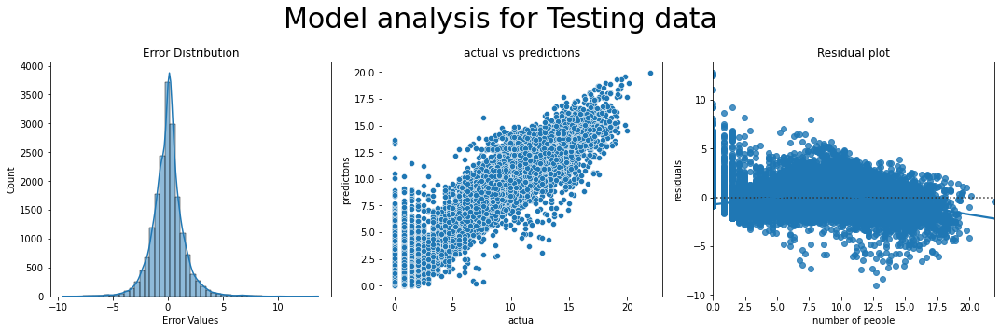

In [62]:
analyse(rforest, xtest, ytest, 'Testing')

# feature selection on basis of variance thershold

In [63]:
# resetting xtrain and xtest
xtrain = df_train[[x for x in df_train.columns if x not in ['number_people']]]
xtest = df_test[[x for x in df_test.columns if x not in ['number_people']]]

In [64]:
from sklearn.feature_selection import VarianceThreshold
varienceData = VarianceThreshold(threshold=0.5)
varienceData.fit(xtrain[['timestamp', 'day_of_week', 'month', 'temperature', 'day', 'hour', 'minute']])
var_arr = varienceData.get_support()

In [65]:
col = ['timestamp', 'day_of_week', 'month', 'temperature', 'day', 'hour', 'minute']
dump = []
for i in range(len(col)):
    if var_arr[i] ==False:
        dump.append(col[i])
dump
    

[]

In [66]:
xtrain = df_train[[x for x in df_train.columns if x not in ['number_people'] and x not in dump]]
xtest = df_test[[x for x in df_test.columns if x not in ['number_people'] and x not in dump]]

In [67]:
xtrain.shape, xtest.shape

((43528, 11), (18656, 11))

Model RMSE: 3.2488
Model r2_score: 0.5524


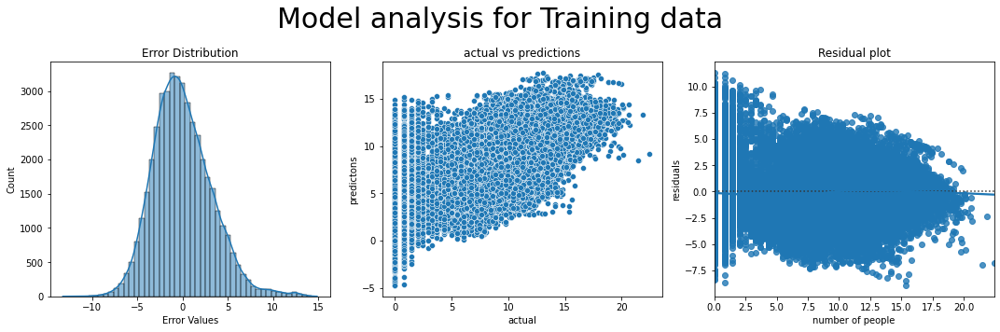

In [68]:
model.fit(xtrain, ytrain)
analyse(model, xtrain, ytrain, 'Training')

Model RMSE: 3.261
Model r2_score: 0.5546


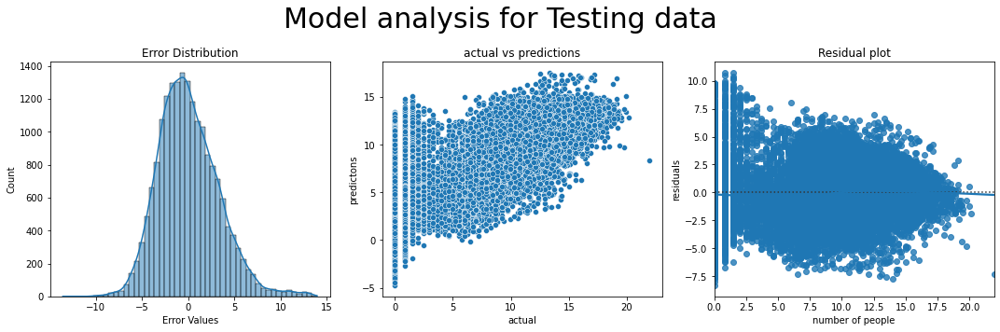

In [69]:
analyse(model, xtest, ytest, 'Testing')

Model RMSE: 1.1006
Model r2_score: 0.9486


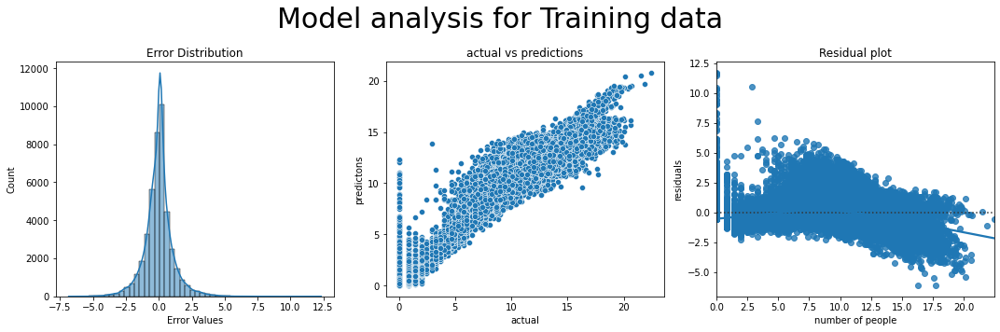

In [70]:
rforest = RandomForestRegressor( max_depth = 15)
rforest.fit(xtrain, ytrain)
analyse(rforest, xtrain, ytrain, 'Training')

Model RMSE: 1.3594
Model r2_score: 0.9226


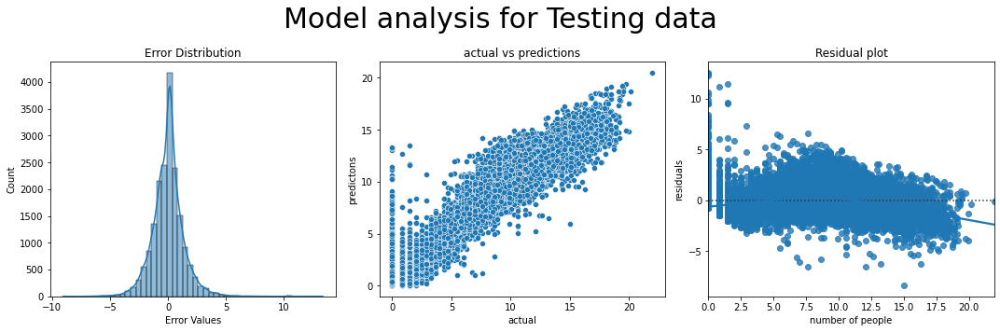

In [71]:
analyse(rforest, xtest, ytest, 'Testing')

# Feature selection on basis of Information Gain

In [72]:
# resetting xtrain and xtest
xtrain = df_train[[x for x in df_train.columns if x not in ['number_people']]]
ytrain = df_train['number_people']
xtest = df_test[[x for x in df_test.columns if x not in ['number_people']]]
ytest = df_test['number_people']

In [73]:
from sklearn.feature_selection import mutual_info_classif
importance = mutual_info_classif(xtrain, ytrain)

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'timestamp'),
  Text(1, 0, 'hour'),
  Text(2, 0, 'temperature'),
  Text(3, 0, 'minute'),
  Text(4, 0, 'is_during_semester'),
  Text(5, 0, 'month'),
  Text(6, 0, 'day_of_week'),
  Text(7, 0, 'is_weekend'),
  Text(8, 0, 'is_start_of_semester'),
  Text(9, 0, 'day'),
  Text(10, 0, 'is_holiday')])

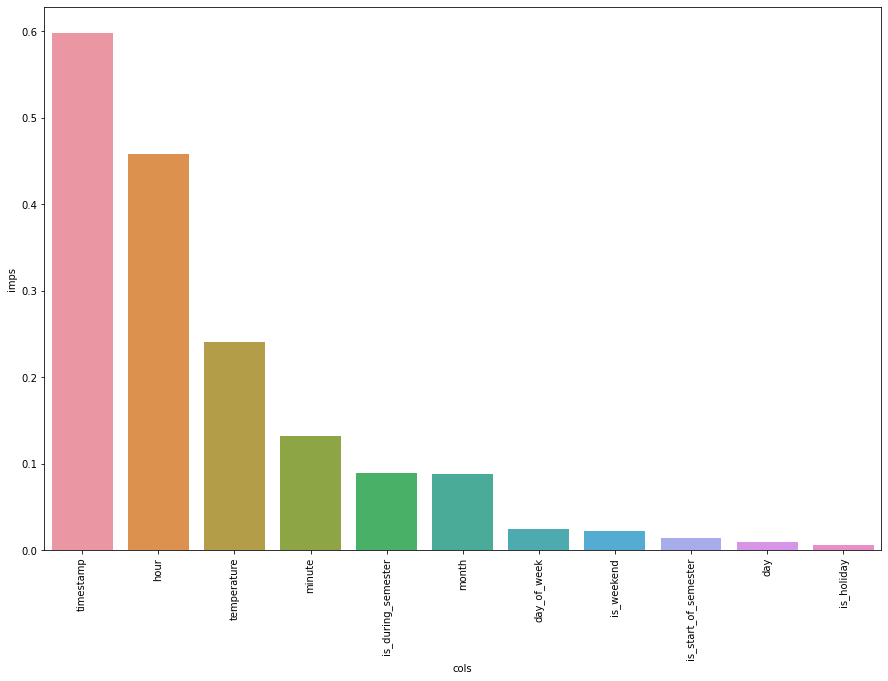

In [74]:
x = importance.argsort()
x = x[::-1]
feat_imp=pd.DataFrame({
        'cols':xtrain.columns[x],
        'imps':importance[x]})
        # plot feature importance
plt.figure(figsize = (15,10))
sns.barplot(x = 'cols', y = 'imps', data = feat_imp)
#plt.yscale('log')
plt.xticks(rotation=90)

In [85]:
dump = ['is_holiday', 'day', 'is_start_of_semester', 'is_weekend','day_of_week']

In [86]:
xtrain = df_train[[x for x in df_train.columns if x not in ['number_people'] and x not in dump]]
xtest = df_test[[x for x in df_test.columns if x not in ['number_people'] and x not in dump]]

Model RMSE: 16.2397
Model r2_score: 0.4874


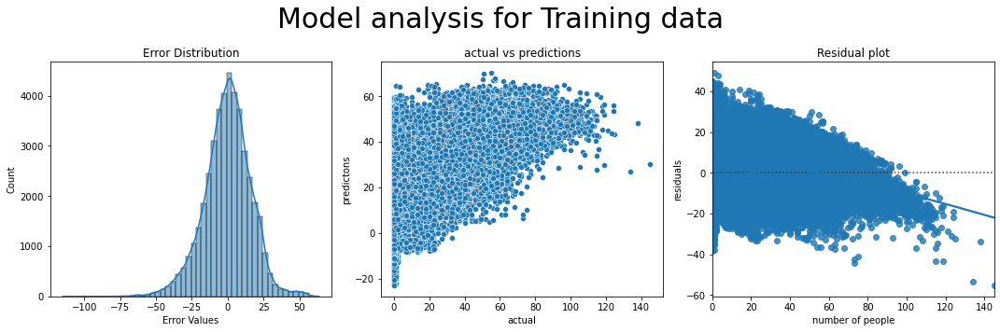

In [87]:
model.fit(xtrain, ytrain)
analyse(model, xtrain, ytrain, 'Training')

Model RMSE: 16.1831
Model r2_score: 0.4919


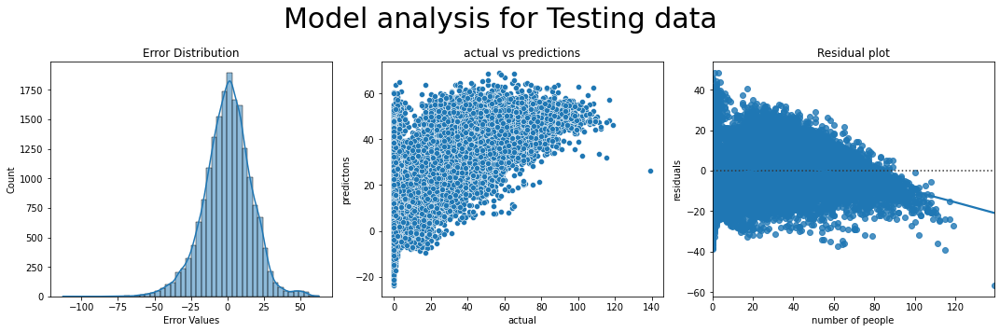

In [88]:
analyse(model, xtest, ytest, 'Testing')

Model RMSE: 8.5506
Model r2_score: 0.8579


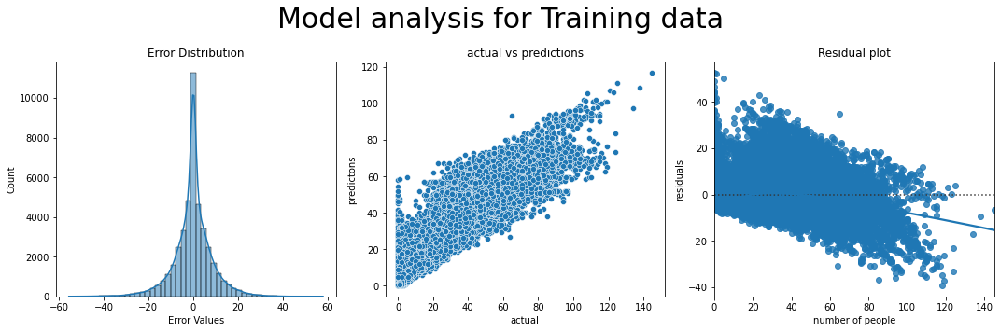

In [89]:
rforest.fit(xtrain, ytrain)
analyse(rforest, xtrain, ytrain, 'Training')

Model RMSE: 10.6131
Model r2_score: 0.7815


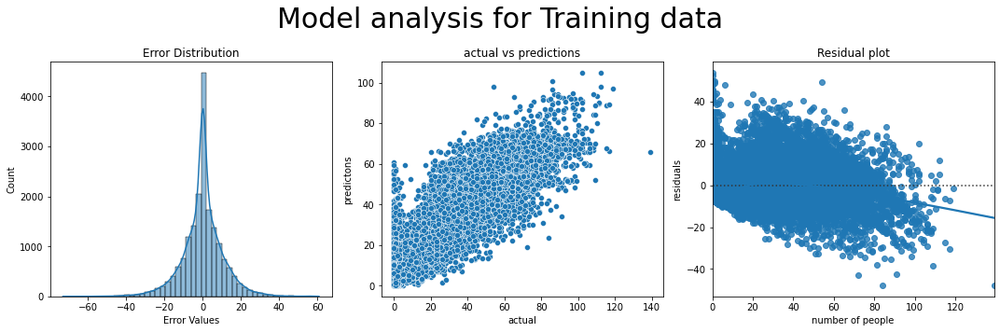

In [90]:
analyse(rforest, xtest, ytest, 'Training')

# Feature selection on basis of Chi Square

In [75]:
from sklearn.feature_selection import SelectKBest, chi2
selector = SelectKBest(chi2, k=8) # number of features to select "k"
newX = selector.fit(xtrain, ytrain)


In [76]:
newX.scores_

array([1.96535916e+08, 2.01316512e+03, 1.30020954e+03, 1.96537502e+02,
       4.65162532e+03, 2.07917733e+03, 1.99507745e+03, 1.43504163e+03,
       5.69272847e+04, 2.55023742e+03, 1.66296768e+03])

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'timestamp'),
  Text(1, 0, 'hour'),
  Text(2, 0, 'temperature'),
  Text(3, 0, 'minute'),
  Text(4, 0, 'is_start_of_semester'),
  Text(5, 0, 'day_of_week'),
  Text(6, 0, 'is_during_semester'),
  Text(7, 0, 'day'),
  Text(8, 0, 'month'),
  Text(9, 0, 'is_weekend'),
  Text(10, 0, 'is_holiday')])

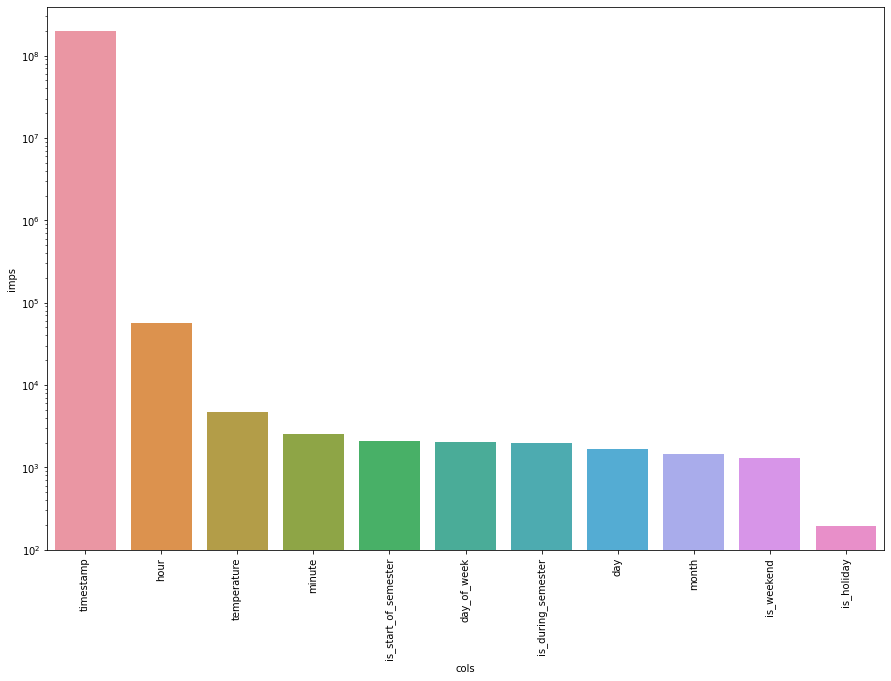

In [77]:
x = newX.scores_.argsort()
x = x[::-1]
feat_imp=pd.DataFrame({
        'cols':xtrain.columns[x],
        'imps':newX.scores_[x]})
        # plot feature importance
plt.figure(figsize = (15,10))
sns.barplot(x = 'cols', y = 'imps', data = feat_imp)
plt.yscale('log')
plt.xticks(rotation=90)

In [78]:
dump = ['day', 'month', 'is_wekend', 'is_holiday']

In [79]:
xtrain = df_train[[x for x in df_train.columns if x not in ['number_people'] and x not in dump]]
xtest = df_test[[x for x in df_test.columns if x not in ['number_people'] and x not in dump]]
xtrain.shape, xtest.shape

((43528, 8), (18656, 8))

Model RMSE: 15.7971
Model r2_score: 0.515


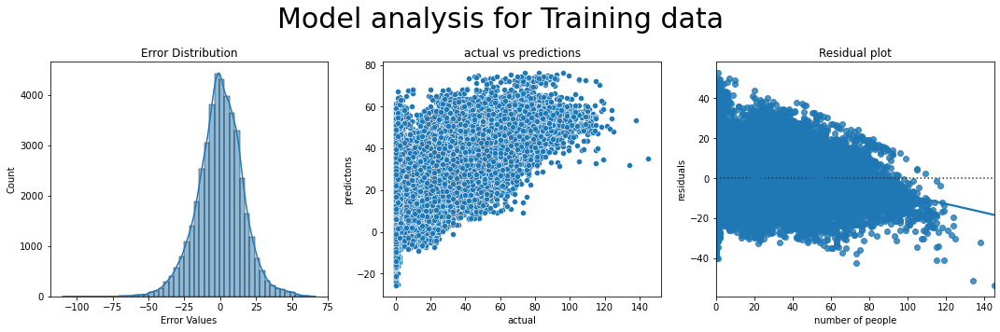

In [80]:
model.fit(xtrain, ytrain)
analyse(model, xtrain, ytrain, 'Training')

Model RMSE: 15.7341
Model r2_score: 0.5197


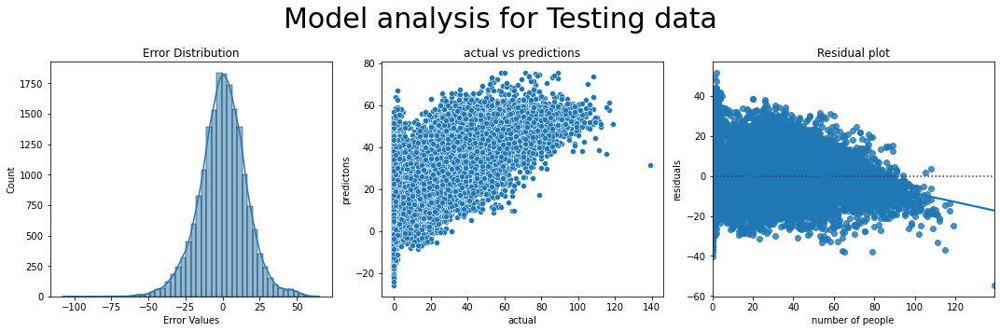

In [81]:
analyse(model, xtest, ytest, 'Testing')

Model RMSE: 7.6989
Model r2_score: 0.8848


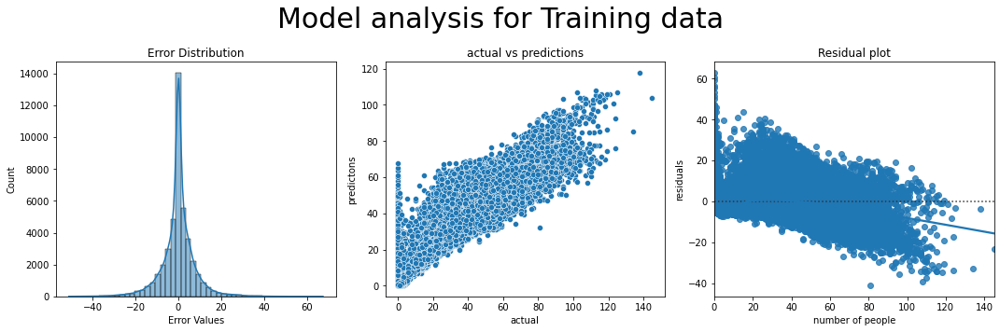

In [82]:
rforest.fit(xtrain, ytrain)
analyse(rforest, xtrain, ytrain, 'Training')

Model RMSE: 9.5028
Model r2_score: 0.8248


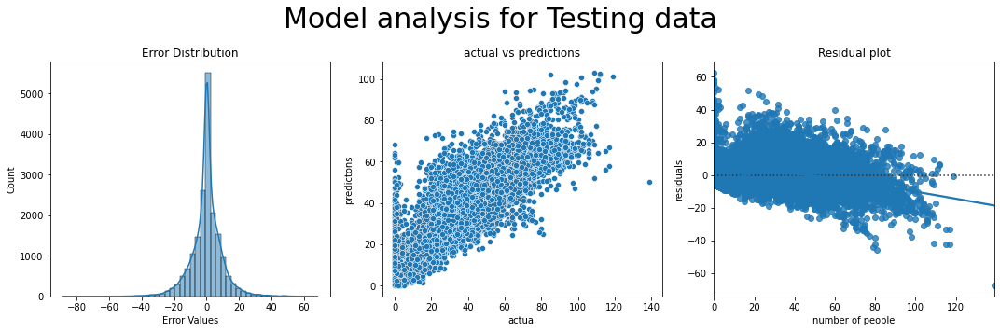

In [83]:
analyse(rforest, xtest, ytest, 'Testing')

# feature selection based on fisher score


In [92]:
# resetting xtrain and xtest
xtrain = df_train[[x for x in df_train.columns if x not in ['number_people']]]
xtest = df_test[[x for x in df_test.columns if x not in ['number_people']]]

In [ ]:
from skfeature.function.similarity_based import fisher_score
ranks = fisher_score.fisher_score(xtrain, ytrain)
x = ranks.argsort()
x = x[::-1]
feat_imp=pd.DataFrame({
        'cols':xtrain.columns[x],
        'imps':ranks[x]})
        # plot feature importance
plt.figure(figsize = (15,10))
sns.barplot(x = 'cols', y = 'imps', data = feat_imp)
#plt.yscale('log')
plt.xticks(rotation=90)

In [ ]:
ranks = fisher_score.fisher_score(xtrain, ytrain)

# Wrapper Methods

# Forward feature Selection

In [94]:
from sklearn.feature_selection import SequentialFeatureSelector
ffs = SequentialFeatureSelector(model, n_features_to_select=8, direction='forward', n_jobs=-1)
ffs.fit(xtrain, ytrain)
selection = ffs.get_support()
featureList = []
totalFeatureList = xtrain.columns
for i, name in enumerate(totalFeatureList):
    if selection[i] == True:
        featureList.append(name)

In [95]:
featureList

['day_of_week',
 'is_weekend',
 'temperature',
 'is_start_of_semester',
 'is_during_semester',
 'month',
 'hour',
 'day']

In [96]:
x_train = xtrain[featureList]
x_test = xtest[featureList]

Model RMSE: 15.9271
Model r2_score: 0.5069


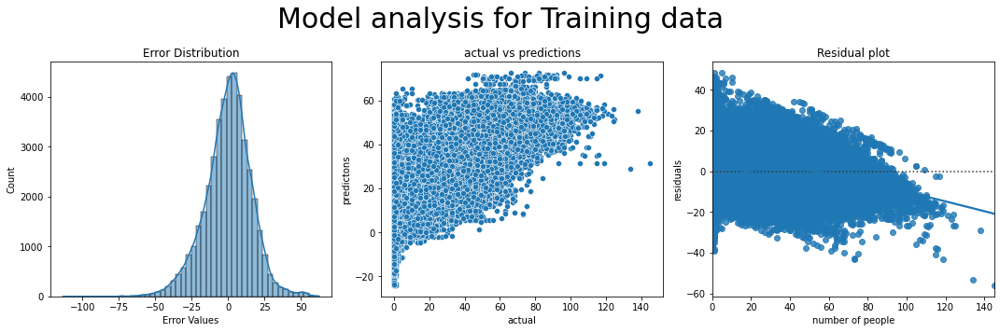

In [98]:
model.fit(x_train, ytrain)
analyse(model, x_train, ytrain, 'Training')

Model RMSE: 15.8216
Model r2_score: 0.5143


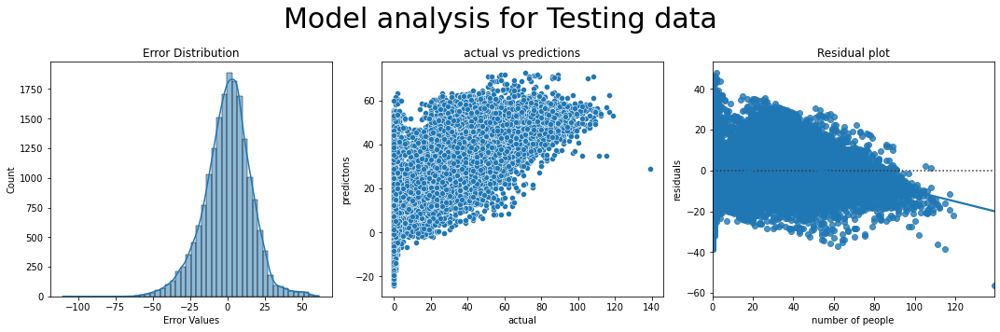

In [99]:
analyse(model, x_test, ytest, 'Testing')

In [100]:
ffs = SequentialFeatureSelector(rforest, n_features_to_select=8, direction='forward', n_jobs=-1)
ffs.fit(xtrain, ytrain)
selection = ffs.get_support()
featureList = []
totalFeatureList = xtrain.columns
for i, name in enumerate(totalFeatureList):
    if selection[i] == True:
        featureList.append(name)

In [101]:
featureList

['timestamp',
 'day_of_week',
 'is_holiday',
 'temperature',
 'is_start_of_semester',
 'month',
 'hour',
 'day']

In [102]:
x_train = xtrain[featureList]
x_test = xtest[featureList]

Model RMSE: 5.4541
Model r2_score: 0.9422


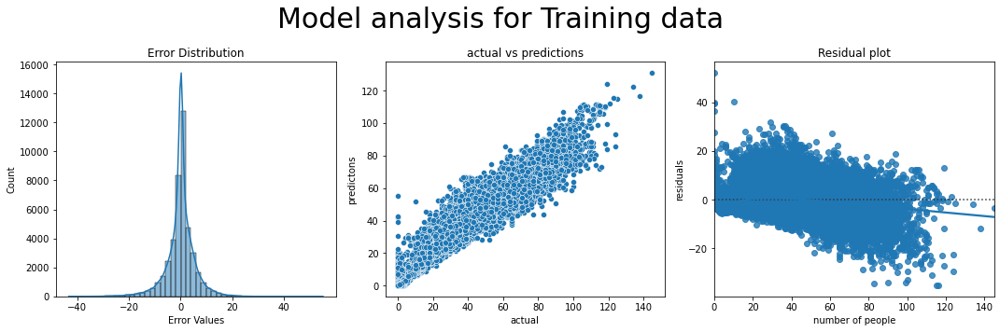

In [103]:
rforest.fit(x_train, ytrain)
analyse(rforest, x_train, ytrain, 'Training')

Model RMSE: 6.8398
Model r2_score: 0.9092


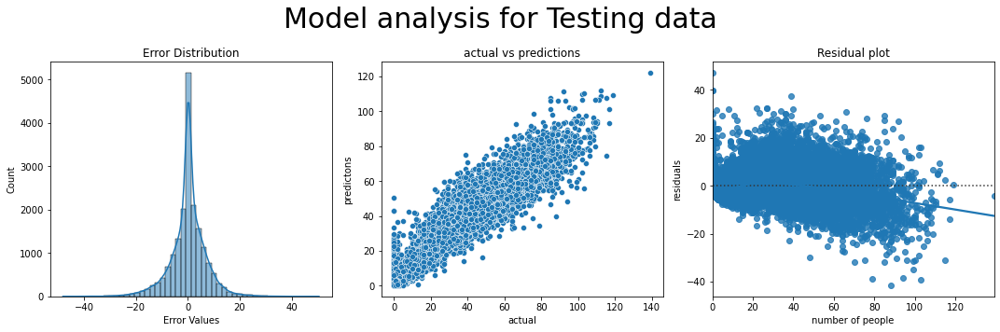

In [104]:
analyse(rforest, x_test, ytest, 'Testing')

# Backward Feature Elemination

In [105]:
bfs = SequentialFeatureSelector(model, n_features_to_select=8, direction='backward', n_jobs=-1)
bfs.fit(xtrain, ytrain)
selection = bfs.get_support()
featureList = []
totalFeatureList = xtrain.columns
for i, name in enumerate(totalFeatureList):
    if selection[i] == True:
        featureList.append(name)

featureList

['timestamp',
 'is_weekend',
 'temperature',
 'is_start_of_semester',
 'is_during_semester',
 'month',
 'hour',
 'minute']

In [106]:
x_train = xtrain[featureList]
x_test = xtest[featureList]

Model RMSE: 15.6621
Model r2_score: 0.5232


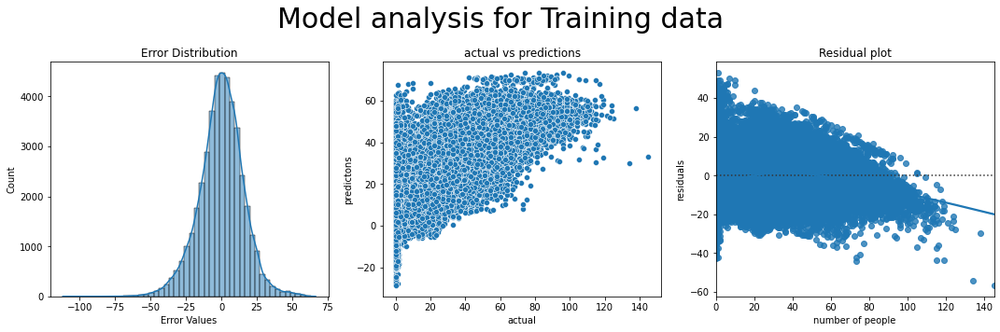

In [107]:
model.fit(x_train, ytrain)
analyse(model, x_train, ytrain, 'Training')

Model RMSE: 15.6095
Model r2_score: 0.5273


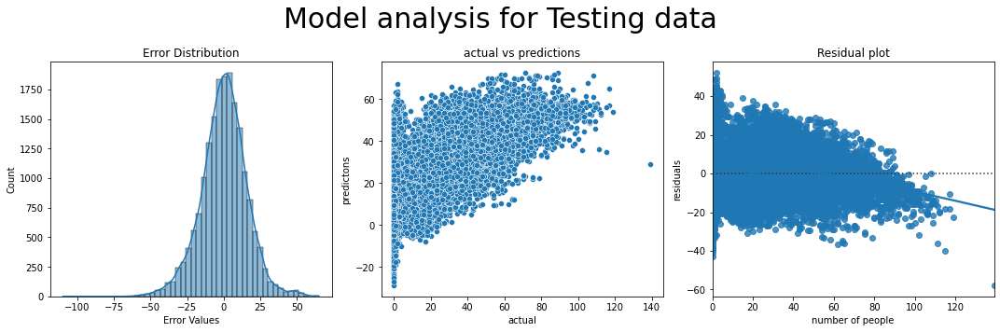

In [108]:
analyse(model, x_test, ytest, 'Testing')

In [109]:
bfs = SequentialFeatureSelector(rforest, n_features_to_select=8, direction='backward', n_jobs=-1)
bfs.fit(xtrain, ytrain)
selection = bfs.get_support()
featureList = []
totalFeatureList = xtrain.columns
for i, name in enumerate(totalFeatureList):
    if selection[i] == True:
        featureList.append(name)

featureList

['timestamp',
 'day_of_week',
 'is_weekend',
 'temperature',
 'is_start_of_semester',
 'month',
 'hour',
 'day']

In [112]:
x_train = xtrain[featureList]
x_test = xtest[featureList]

Model RMSE: 5.4446
Model r2_score: 0.9424


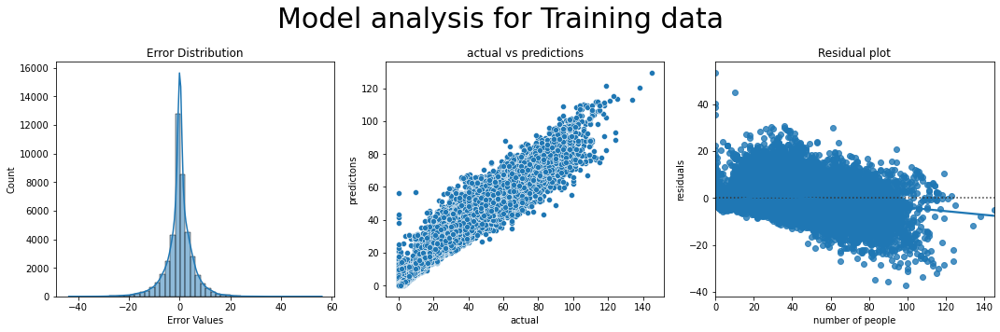

In [113]:
rforest.fit(x_train, ytrain)
analyse(rforest, x_train, ytrain, 'Training')

Model RMSE: 6.8341
Model r2_score: 0.9094


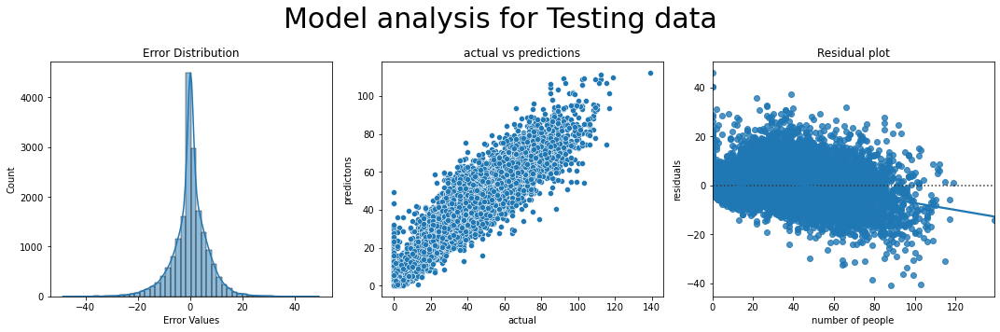

In [114]:
analyse(rforest, x_test, ytest, 'Testing')

# Exhaustive Feature Selection

In [ ]:
from mlxtend.feature_selection import ExhaustiveFeatureSelector
efs = ExhaustiveFeatureSelector(model, min_features=6, max_features=10, scoring='roc_auc',n_jobs=-1)
efs = efs.fit(xtrain, ytrain)
featureList = xtrain.columns[list(efs.best_idx_)]
featureList

In [124]:
from itertools import combinations
from sklearn.model_selection import cross_val_score
def best_subset(estimator, X, y, max_size=8, cv=5):
#Calculates the best model of up to max_size features of X.
 #  estimator must have a fit and score functions.
  # X must be a DataFrame.

    n_features = X.shape[1]
    subsets = (combinations(range(n_features), k + 1) 
               for k in range(min(n_features, max_size)))

    best_size_subset = []
    for subsets_k in subsets:  # for each list of subsets of the same size
        best_score = -np.inf
        best_subset = None
        for subset in subsets_k: # for each subset
            estimator.fit(X.iloc[:, list(subset)], y)
            # get the subset with the best score among subsets of the same size
            score = estimator.score(X.iloc[:, list(subset)], y)
            if score > best_score:
                best_score, best_subset = score, subset
        # to compare subsets of different sizes we must use CV
        # first store the best subset of each size
        best_size_subset.append(best_subset)

    # compare best subsets of each size
    best_score = -np.inf
    best_subset = None
    list_scores = []
    for subset in best_size_subset:
        score = cross_val_score(estimator, X.iloc[:, list(subset)], y, cv=cv).mean()
        list_scores.append(score)
        if score > best_score:
            best_score, best_subset = score, subset

    return best_subset, best_score, best_size_subset, list_scores

In [140]:
featureList, score, best_size, cvscores = best_subset(model, xtrain, ytrain)
print('features' , featureList)
print('best score', score)
print('support', cvscores)
print('size', best_size)

features (0, 2, 4, 5, 6, 7, 8, 9)
best score 0.5229068547796055
support [0.306385249286444, 0.40136311807371927, 0.45297871296060277, 0.48144941044568157, 0.49772060288331427, 0.5036728300688222, 0.516687676704886, 0.5229068547796055]
size [(8,), (6, 8), (4, 6, 8), (2, 4, 6, 8), (2, 4, 6, 7, 8), (2, 4, 5, 6, 7, 8), (0, 2, 4, 6, 7, 8, 9), (0, 2, 4, 5, 6, 7, 8, 9)]


In [141]:
cols = xtrain.columns
features = []
for i in featureList:
    features.append(cols[i])
    
features

['timestamp',
 'is_weekend',
 'temperature',
 'is_start_of_semester',
 'is_during_semester',
 'month',
 'hour',
 'minute']

In [130]:
x_train = xtrain[features]
x_test = xtest[features]
x_train.shape, x_test.shape

((43528, 8), (18656, 8))

Model RMSE: 15.6621
Model r2_score: 0.5232


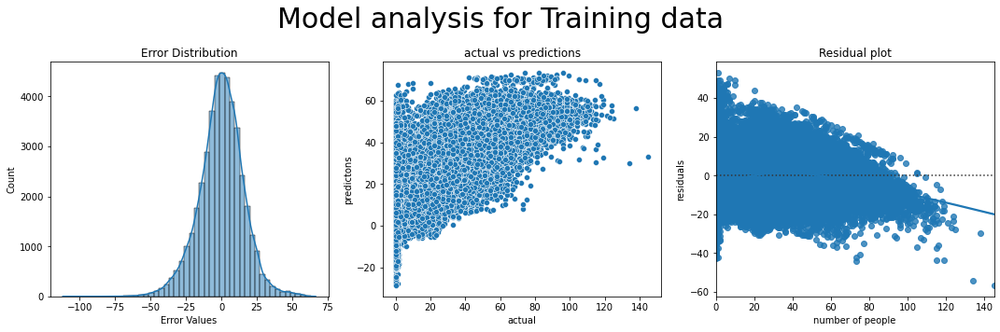

In [131]:
model.fit(x_train, ytrain)
analyse(model, x_train, ytrain, 'Training')

Model RMSE: 15.6095
Model r2_score: 0.5273


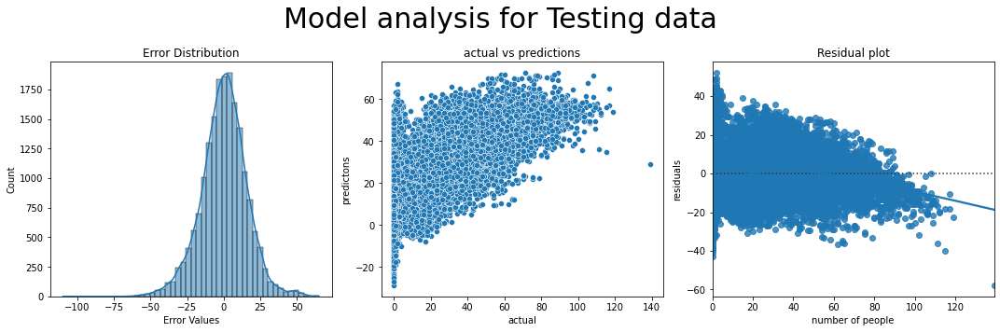

In [132]:
analyse(model, x_test, ytest, 'Testing')

featureList, score, best_size, cvscores = best_subset(model, xtrain, ytrain)
print('features' , featureList)
print('best score', score)
print('support', cvscores)
print('size', best_size)


cols = xtrain.columns
features = []
for i in featureList:
    features.append(cols[i])
    
features

In [142]:
x_train = xtrain[features]
x_test = xtest[features]

Model RMSE: 7.854
Model r2_score: 0.8801


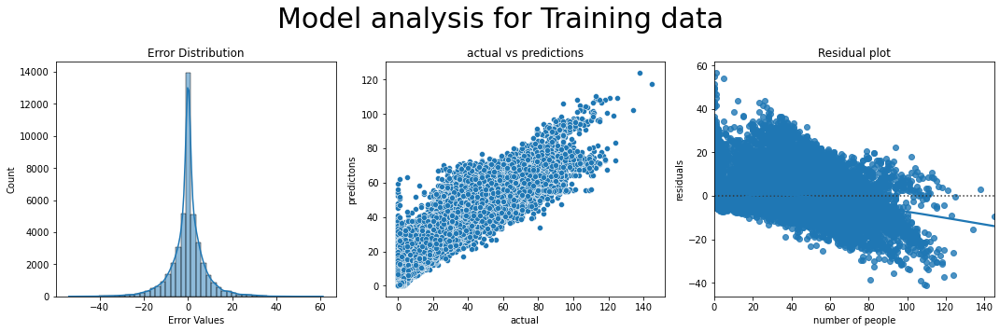

In [143]:
rforest.fit(x_train, ytrain)
analyse(rforest, x_train, ytrain, 'Training')

Model RMSE: 9.6728
Model r2_score: 0.8185


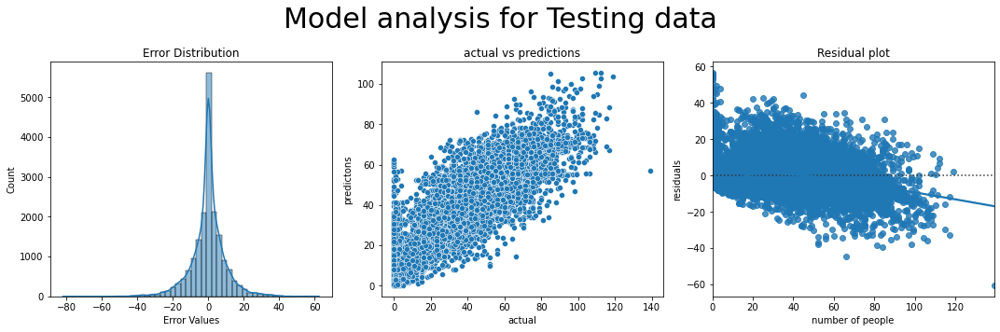

In [144]:
analyse(rforest, x_test, ytest, 'Testing')

# Recursive Feature Elimination


In [147]:
from sklearn.feature_selection import RFE
rfe=RFE(model, n_features_to_select=8)
rfe.fit(xtrain, ytrain)
selection = rfe.support_

In [146]:
rfe.ranking_

array([3, 1, 1, 1, 1, 1, 1, 1, 1, 2, 4])

In [148]:
featureList = []
totalFeatureList = xtrain.columns
for i, name in enumerate(totalFeatureList):
    if selection[i] == True:
        featureList.append(name)

featureList

['day_of_week',
 'is_weekend',
 'is_holiday',
 'temperature',
 'is_start_of_semester',
 'is_during_semester',
 'month',
 'hour']

In [149]:
x_train = xtrain[featureList]
x_test = xtest[featureList]

Model RMSE: 15.9294
Model r2_score: 0.5068


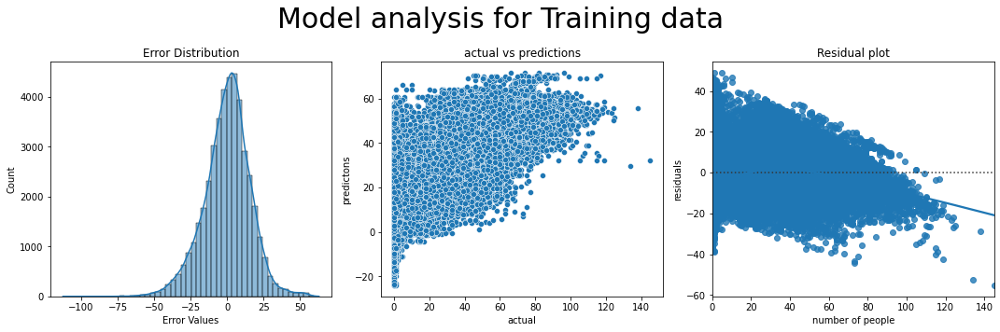

In [150]:
model.fit(x_train, ytrain)
analyse(model, x_train, ytrain, 'Training')

Model RMSE: 15.8292
Model r2_score: 0.5139


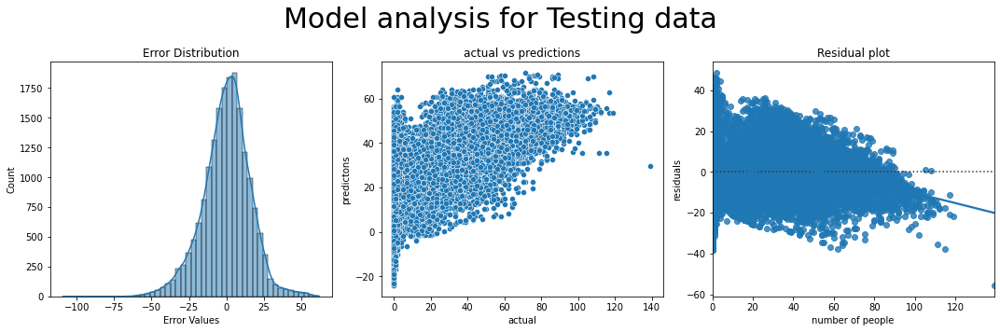

In [151]:
analyse(model, x_test, ytest, 'Testing')

In [153]:
rfe=RFE(rforest, n_features_to_select=8)
rfe.fit(xtrain, ytrain)
selection = rfe.support_

In [154]:
featureList = []
totalFeatureList = xtrain.columns
for i, name in enumerate(totalFeatureList):
    if selection[i] == True:
        featureList.append(name)

featureList

['timestamp',
 'day_of_week',
 'is_weekend',
 'temperature',
 'is_during_semester',
 'month',
 'minute',
 'day']

In [155]:
x_train = xtrain[featureList]
x_test = xtest[featureList]

Model RMSE: 6.8349
Model r2_score: 0.9092


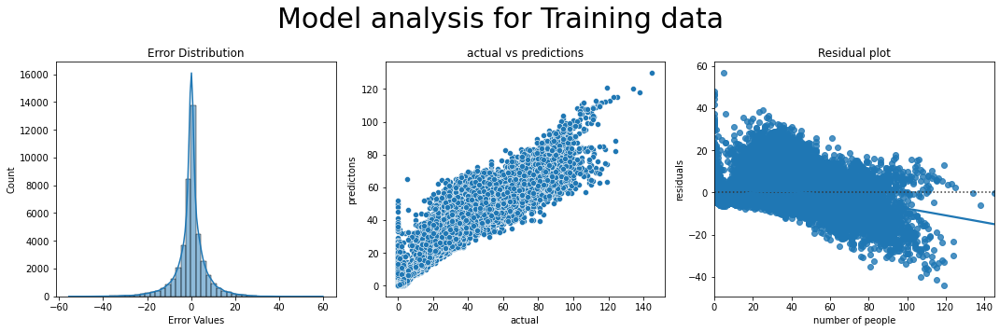

In [156]:
rforest.fit(x_train, ytrain)
analyse(rforest, x_train, ytrain, 'Training')

Model RMSE: 8.0886
Model r2_score: 0.8731


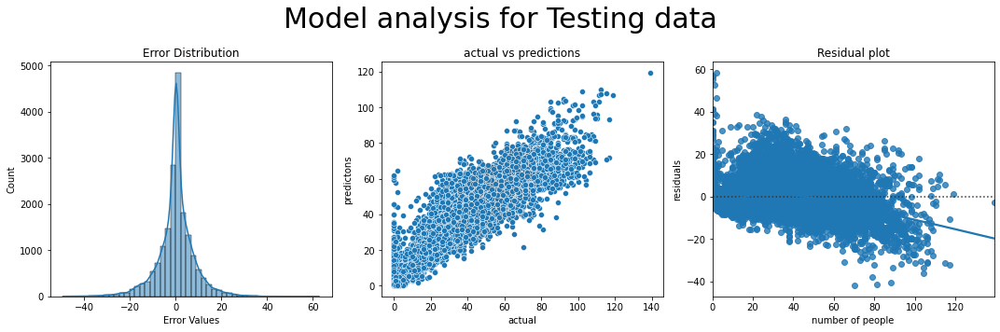

In [157]:
analyse(rforest, x_test, ytest, 'Testing')


# Lasso Regularization only for linear regression


In [158]:
from sklearn.feature_selection import SelectFromModel
from sklearn.linear_model import Lasso
lin_model = Lasso(alpha = 1)
lin_model.fit(xtrain, ytrain)

Lasso(alpha=1)

In [163]:
# Function For hyper parameter tuning of the model
from sklearn.model_selection import GridSearchCV   #Performing grid search
def bestvalues(model, x, y, parameters ,cvrounds = 5, scoring = 'r2'):
    grid_search = GridSearchCV(estimator = model,  
                           param_grid = parameters,
                           scoring = scoring,
                           cv = cvrounds,
                           verbose=0)
    
    grid_search.fit(x,y)
    # best score achieved during the GridSearchCV
    print('GridSearch CV best score : {:.4f}\n\n'.format(grid_search.best_score_))

# print parameters that give the best results
    print('Parameters that give the best results :','\n\n', (grid_search.best_params_))

# print estimator that was chosen by the GridSearch
    print('\n\nEstimator that was chosen by the search :','\n\n', (grid_search.best_estimator_))
    return grid_search.best_estimator_

In [165]:
param = {'alpha': [ 0.001,0.01, 0.1, 1, 10, 100, 1000, 10000]}
lin_model = bestvalues(lin_model, xtrain, ytrain, param)

GridSearch CV best score : 0.5080


Parameters that give the best results : 

 {'alpha': 0.001}


Estimator that was chosen by the search : 

 Lasso(alpha=0.001)


Model RMSE: 15.9035
Model r2_score: 0.5084


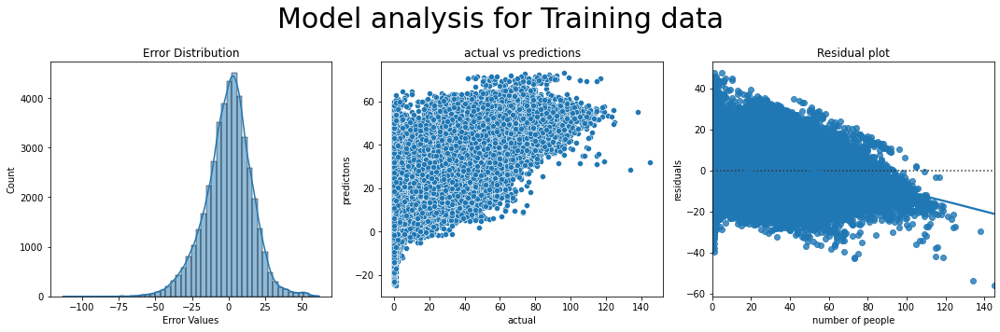

In [168]:
lin_model.fit(xtrain, ytrain)
analyse(lin_model, xtrain, ytrain, 'Training')

Model RMSE: 15.8065
Model r2_score: 0.5153


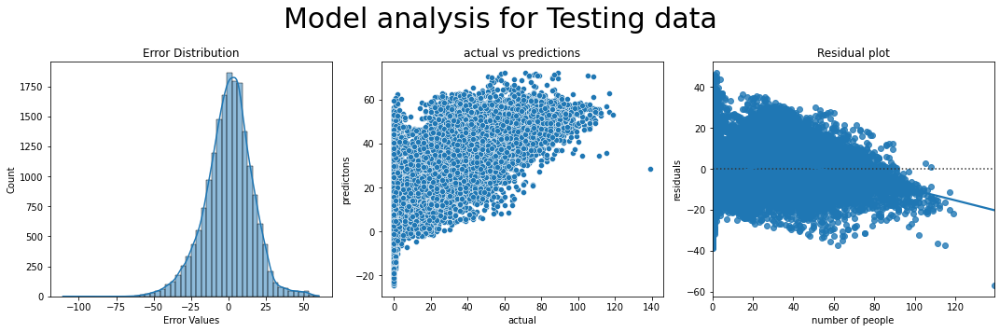

In [170]:
analyse(lin_model, xtest, ytest, 'Testing')

# Random Forest Importance

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'timestamp'),
  Text(1, 0, 'is_during_semester'),
  Text(2, 0, 'temperature'),
  Text(3, 0, 'month'),
  Text(4, 0, 'day_of_week'),
  Text(5, 0, 'day'),
  Text(6, 0, 'minute'),
  Text(7, 0, 'is_weekend'),
  Text(8, 0, 'is_start_of_semester'),
  Text(9, 0, 'hour'),
  Text(10, 0, 'is_holiday')])

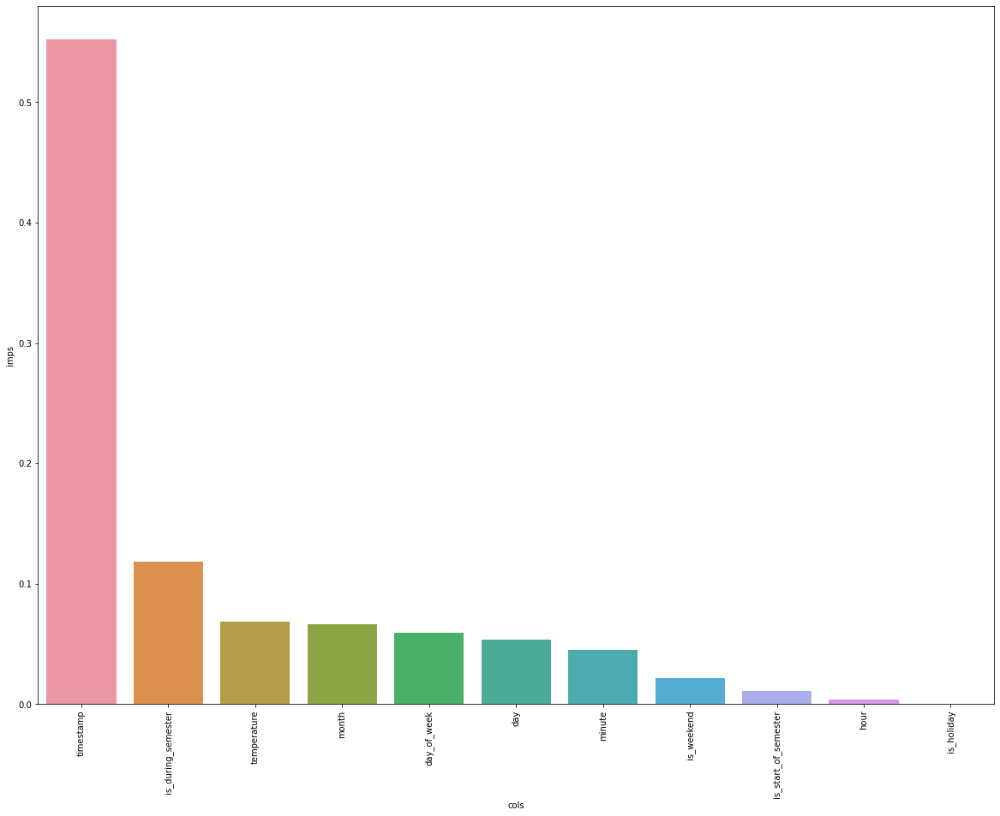

In [172]:
rforest.fit(xtrain, ytrain)
importance = rforest.feature_importances_.argsort()
importance = importance[::-1]
feat_imp=pd.DataFrame({
'cols':xtrain.columns[importance],
'imps':rforest.feature_importances_[importance]})
# plot feature importance
plt.figure(figsize = (20,15))
sns.barplot(x = 'cols', y = 'imps', data = feat_imp)
plt.xticks(rotation=90)

In [173]:
dump = ['is_weekend', 'is_start_of_semester', 'hour', 'is_holiday']
xtrain = df_train[[x for x in df_train.columns if x not in ['number_people'] and x not in dump]]
xtest = df_test[[x for x in df_test.columns if x not in ['number_people'] and x not in dump]]
xtrain.shape, xtest.shape

((43528, 7), (18656, 7))

Model RMSE: 16.0959
Model r2_score: 0.4964


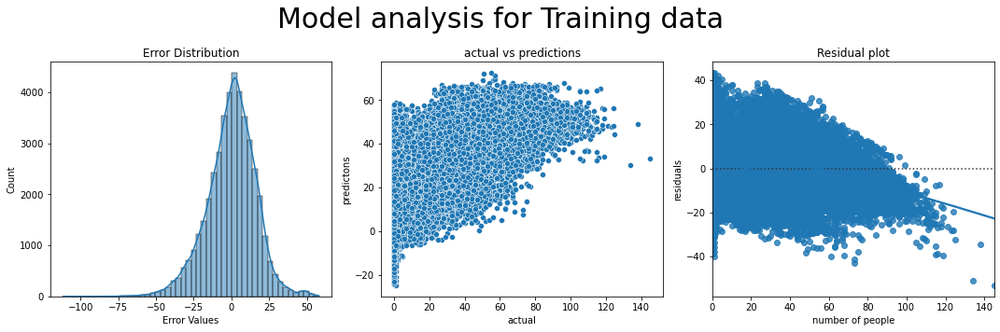

In [174]:
model.fit(xtrain, ytrain)
analyse(model, xtrain, ytrain, 'Training')

Model RMSE: 15.9902
Model r2_score: 0.5039


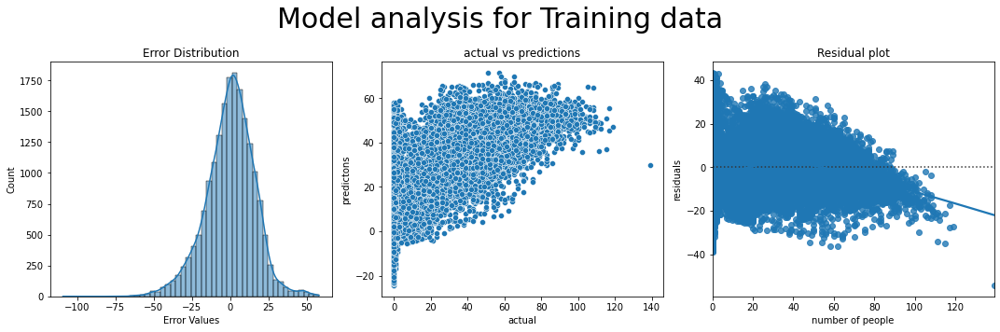

In [175]:
analyse(model, xtest, ytest, 'Training')

Model RMSE: 6.8501
Model r2_score: 0.9088


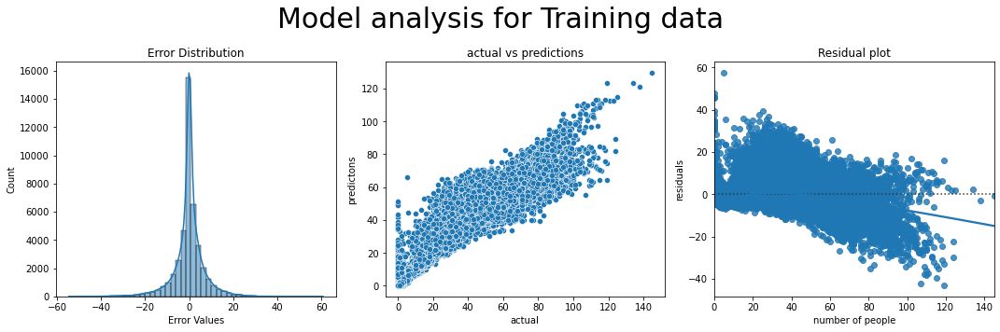

In [176]:
rforest.fit(xtrain, ytrain)
analyse(rforest, xtrain, ytrain, 'Training')

Model RMSE: 8.0727
Model r2_score: 0.8736


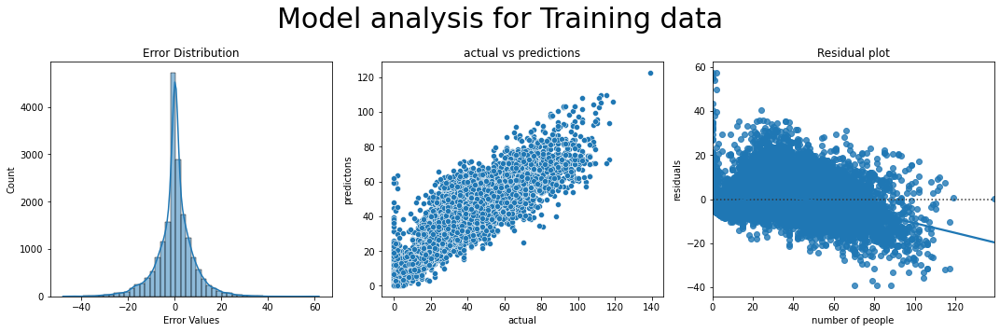

In [177]:
analyse(rforest, xtest, ytest, 'Training')

# Machine learning Pipelining

In [185]:
xtrain = df_train[[x for x in df_train.columns if x not in ['number_people']]]
xtest = df_test[[x for x in df_test.columns if x not in ['number_people'] ]]
xtrain.shape, xtest.shape

((43528, 11), (18656, 11))

In [179]:
from sklearn.preprocessing import RobustScaler
from sklearn.feature_selection import SequentialFeatureSelector
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import RFE

In [186]:
pipeline  = Pipeline([('scaler', RobustScaler()), 
                      ('ffs', SequentialFeatureSelector(model, n_features_to_select=7, direction='forward', n_jobs=-1)),
                      ('predictor', rforest)]) 

Model RMSE: 7.7008
Model r2_score: 0.8847


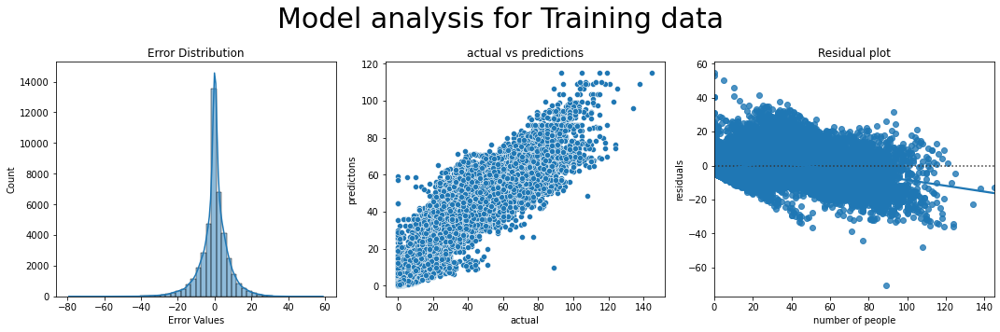

In [187]:
pipeline.fit(xtrain, ytrain)
analyse(pipeline, xtrain, ytrain, 'Training')

Model RMSE: 8.6159
Model r2_score: 0.856


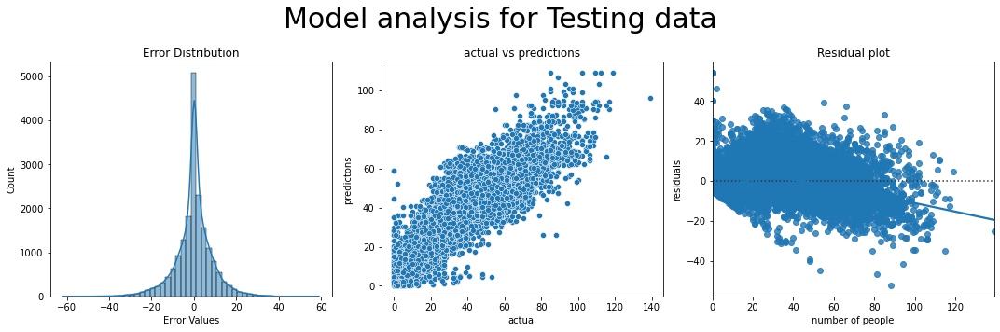

In [188]:
analyse(pipeline, xtest, ytest, 'Testing')